# Work for Leo

In [4]:
# import napari
import os, glob
# from macrohet import dataio, tile, visualise, notify
# from macrohet import visualise
import os
import re
import numpy as np
import pandas as pd
from io import StringIO
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'Nimbus Sans'

In [107]:
# List of input file paths
file_list = [
    'PlateResults_T48h.txt',
    'PlateResults_T72h.txt',
    'PlateResults_T0.txt',
    'PlateResults_T24h.txt'
]

# Initialize an empty list to store DataFrames
dfs = []


# Loop through the files and read them
for file in file_list:
    with open(file, 'r') as f:
        data = f.read()
        
    # Extract the data section starting from "[Data]" keyword
    data_start = data.split('[Data]\n')[1]
    
    # Read the data section into a DataFrame
    df = pd.read_csv(StringIO(data_start), sep='\t')
    
    # Extract the integer part of the time point from the filename (e.g., '48', '72', '0', '24')
    time_point = int(re.search(r'T(\d+)', file).group(1))
    
    # Add a new column with the integer time point
    df['Timepoint'] = time_point
    
    # Append the DataFrame to the list
    dfs.append(df)

# Concatenate all DataFrames into one
df = pd.concat(dfs, ignore_index=True)


In [31]:
df

,Row,Column,Timepoint,Nuclei - Number of Objects,Nuclei - All cells - Mean per Well,Mtb - Number of Objects,Infected cells - Number of Objects,Infected cells - Total Spot Area - Mean per Well,Infected cells - Relative Spot Intensity - Mean per Well,Infected cells - Number of Spots - Mean per Well,...,All cells - Relative Spot Intensity - Mean per Well,All cells - Cell Area [µm²] - Mean per Well,All cells - Cell Roundness - Mean per Well,Number of Analyzed Fields,Time [s],Compound,Concentration,Cell Type,Cell Count,Unnamed: 28
0,1,1,48,628,0.893312,97,48,58.416667,0.009309,2.020833,...,0.000796,181.159032,0.849762,21,0,NaN,NaN,NaN,NaN,NaN
1,1,2,48,1136,0.868838,173,90,57.988889,0.006545,1.922222,...,0.000597,184.038449,0.834056,21,0,NaN,NaN,NaN,NaN,NaN
2,1,3,48,2102,0.890105,191,129,38.992248,0.004863,1.480620,...,0.000335,150.177974,0.849762,21,0,NaN,NaN,NaN,NaN,NaN
3,1,4,48,2414,0.872825,219,137,42.437956,0.005492,1.598540,...,0.000357,155.739118,0.847514,21,0,NaN,NaN,NaN,NaN,NaN
4,1,5,48,5776,0.889543,613,453,37.816777,0.005974,1.353201,...,0.000527,128.768050,0.817272,21,0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
379,8,8,24,112,0.910714,2,2,15.000000,0.001156,1.000000,...,0.000023,79.322262,0.845704,21,0,NaN,NaN,NaN,NaN,NaN
380,8,9,24,174,0.954023,124,55,224.527273,0.078317,2.254545,...,0.025948,72.649534,0.861973,21,0,NaN,NaN,NaN,NaN,NaN
381,8,10,24,160,0.937500,122,47,246.765957,0.086670,2.595745,...,0.027157,76.711989,0.847823,21,0,NaN,NaN,NaN,NaN,NaN
382,8,11,24,605,0.899174,1582,393,350.208651,0.092418,4.025445,...,0.066765,109.140649,0.804488,21,0,NaN,NaN,NaN,NaN,NaN


INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
/tmp/ipykernel_2268986/938787263.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_2268986/938787263.py:11: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.boxplot(
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


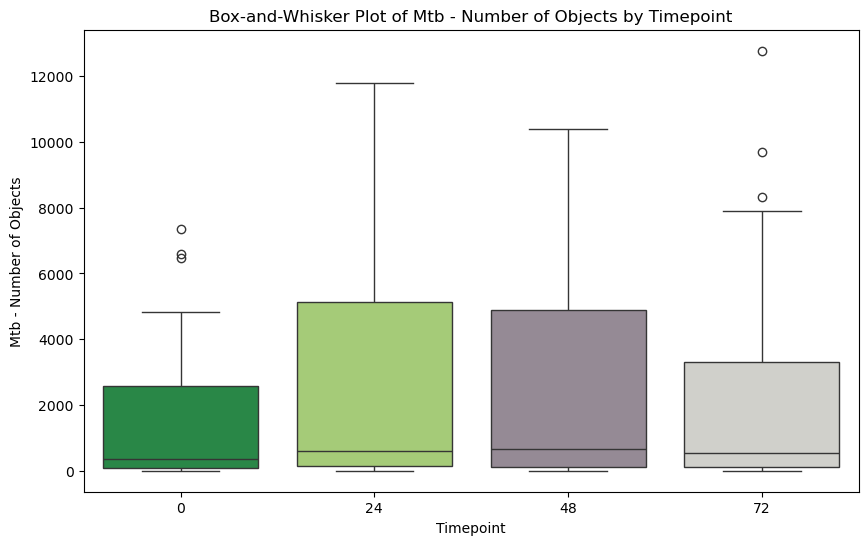

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt


# Define the 'expanded_piyg' color palette
expanded_piyg = ['#1a9641', '#a6d96a', '#978897', '#d1d1ca', '#f1b6da', '#d02c91']


# Create the box-and-whisker plot
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=subset_df,
    x='Timepoint',
    y='Mtb - Number of Objects',
    palette=expanded_piyg
)

# Add labels and title
plt.xlabel('Timepoint')
plt.ylabel('Mtb - Number of Objects')
plt.title('Box-and-Whisker Plot of Mtb - Number of Objects by Timepoint')

# Show the plot
plt.show()

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
/tmp/ipykernel_2268986/45546930.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_2268986/45546930.py:10: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.boxplot(
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


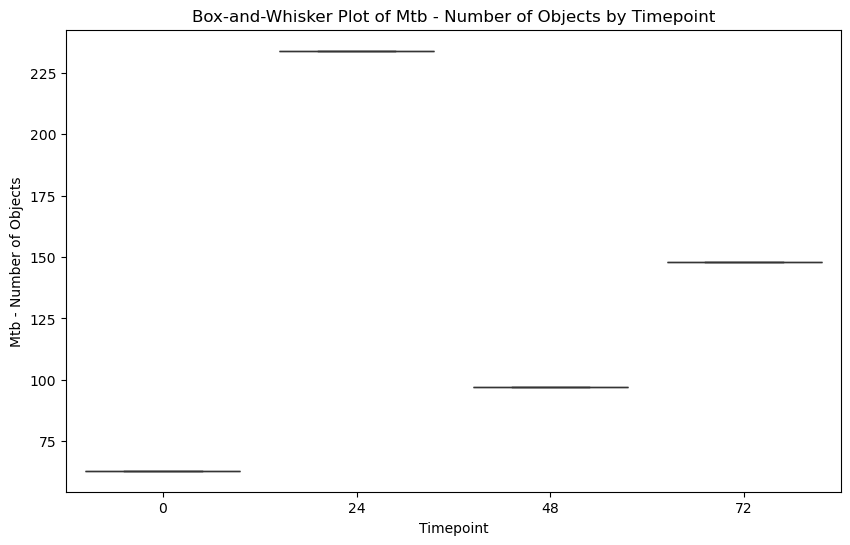

In [37]:
# Define the 'expanded_piyg' color palette
expanded_piyg = ['#1a9641', '#a6d96a', '#978897', '#d1d1ca', '#f1b6da', '#d02c91']
row = 1
column = 1

subset_df = df[(df['Row'] == row) 
             & (df['Column'] == column)
]

# Create the box-and-whisker plot
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=subset_df,
    x='Timepoint',
    y='Mtb - Number of Objects',
    palette=expanded_piyg
)

# Add labels and title
plt.xlabel('Timepoint')
plt.ylabel('Mtb - Number of Objects')
plt.title('Box-and-Whisker Plot of Mtb - Number of Objects by Timepoint')

# Show the plot
plt.show()

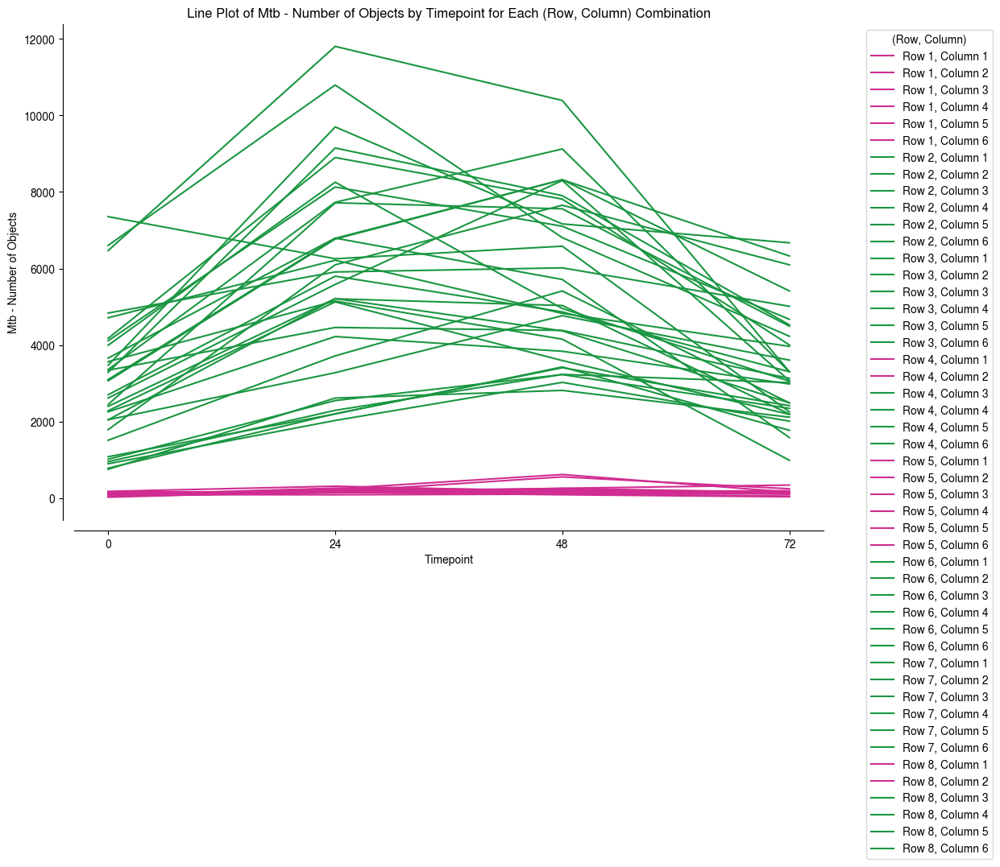

In [45]:

# Get unique row values and sort them
unique_rows = sorted(df['Row'].unique())

# Create a mapping of rows to colors
row_to_color = {row: expanded_piyg[i % len(expanded_piyg)] for i, row in enumerate(unique_rows)}

# Create the line plot
plt.figure(figsize=(12, 8))

# Loop through each unique (Row, Column) combination and plot a line
for (row, column), subset_df in df.groupby(['Row', 'Column']):
    if row > 8:
        continue
    if column > 6:
        continue

    if subset_df['Mtb - Number of Objects'].mean() < 500:
        color = expanded_piyg[-1]
    else:
        color = expanded_piyg[0]
    sns.lineplot(
        data=subset_df,
        x='Timepoint',
        y='Mtb - Number of Objects',
        label=f'Row {row}, Column {column}',
        color=color #row_to_color[row]
    )

# Add labels and title
plt.xlabel('Timepoint')
plt.ylabel('Mtb - Number of Objects')
plt.title('Line Plot of Mtb - Number of Objects by Timepoint for Each (Row, Column) Combination')

# Set x-axis labels to only show the unique Timepoint values present in the data
unique_timepoints = sorted(df['Timepoint'].unique())
plt.xticks(ticks=unique_timepoints)

# Add a legend
plt.legend(title='(Row, Column)', bbox_to_anchor=(1.05, 1), loc='upper left')
sns.despine(offset = 10)
# Show the plot
plt.show()

In [46]:
subset_df.keys()

Index(['Row', 'Column', 'Timepoint', 'Nuclei - Number of Objects',
       'Nuclei - All cells - Mean per Well', 'Mtb - Number of Objects',
       'Infected cells - Number of Objects',
       'Infected cells - Total Spot Area - Mean per Well',
       'Infected cells - Relative Spot Intensity - Mean per Well',
       'Infected cells - Number of Spots - Mean per Well',
       'Infected cells - Number of Spots per Area of Cell - Mean per Well',
       'Uninfected cells - Number of Objects',
       'Uninfected cells - Total Spot Area - Mean per Well',
       'Uninfected cells - Relative Spot Intensity - Mean per Well',
       'Uninfected cells - Number of Spots - Mean per Well',
       'Uninfected cells - Number of Spots per Area of Cell - Mean per Well',
       'Uninfected cells - Infected cells - Mean per Well',
       'All cells - Number of Objects',
       'All cells - Total Spot Area - Mean per Well',
       'All cells - Relative Spot Intensity - Mean per Well',
       'All cells - Cel

In [49]:
from scipy.stats import linregress

In [51]:
params = ['Mtb - Number of Objects',
       'Infected cells - Number of Objects',
       'Infected cells - Total Spot Area - Mean per Well',
       'Infected cells - Relative Spot Intensity - Mean per Well',
       'Infected cells - Number of Spots - Mean per Well',
       'Infected cells - Number of Spots per Area of Cell - Mean per Well',
       'Uninfected cells - Number of Objects',
       'Uninfected cells - Total Spot Area - Mean per Well',
       'Uninfected cells - Relative Spot Intensity - Mean per Well',
       'Uninfected cells - Number of Spots - Mean per Well',
       'Uninfected cells - Number of Spots per Area of Cell - Mean per Well',
       'Uninfected cells - Infected cells - Mean per Well',
       'All cells - Number of Objects',
       'All cells - Total Spot Area - Mean per Well',
       'All cells - Relative Spot Intensity - Mean per Well',
       'All cells - Cell Area [µm²] - Mean per Well',
       'All cells - Cell Roundness - Mean per Well']

Negative Gradient (Green):
Row 1, Column 2, Row 1, Column 11, Row 1, Column 12, Row 2, Column 3, Row 2, Column 5, Row 2, Column 10, Row 3, Column 5, Row 3, Column 6, Row 4, Column 2, Row 4, Column 3, Row 4, Column 5, Row 4, Column 6, Row 4, Column 7, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 5, Column 11, Row 5, Column 12, Row 6, Column 5, Row 6, Column 9, Row 7, Column 3, Row 7, Column 5, Row 8, Column 2, Row 8, Column 3, Row 8, Column 7, Row 8, Column 9, Row 8, Column 10

Positive Gradient (Pink):
Row 1, Column 1, Row 1, Column 3, Row 1, Column 4, Row 1, Column 5, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8, Row 1, Column 9, Row 1, Column 10, Row 2, Column 1, Row 2, Column 2, Row 2, Column 4, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12

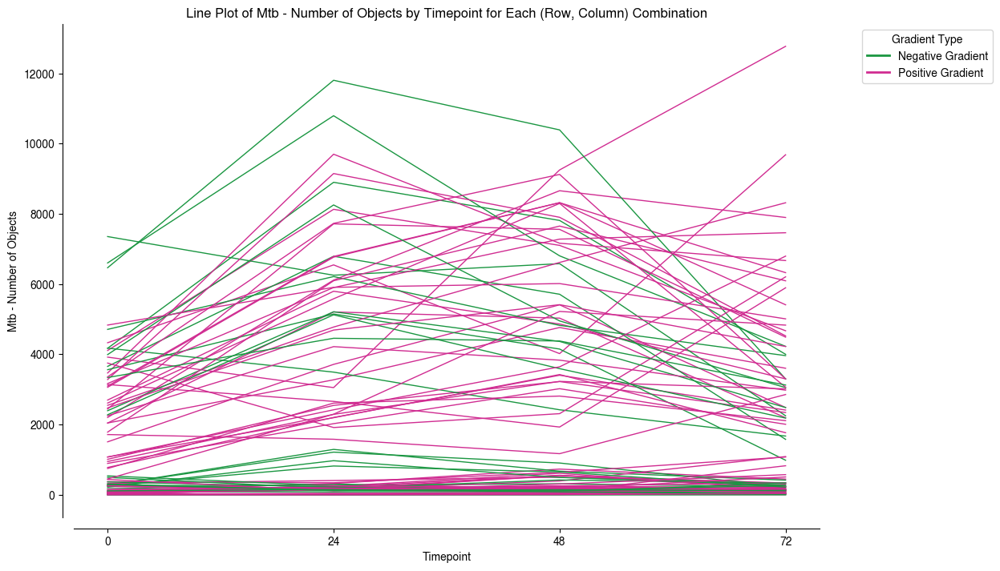

Negative Gradient (Green):
Row 1, Column 2, Row 1, Column 12, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 7, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 4, Column 2, Row 4, Column 3, Row 4, Column 5, Row 4, Column 6, Row 4, Column 7, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 5, Column 11, Row 5, Column 12, Row 6, Column 1, Row 6, Column 3, Row 6, Column 4, Row 6, Column 5, Row 6, Column 6, Row 6, Column 9, Row 6, Column 10, Row 6, Column 11, Row 6, Column 12, Row 7, Column 3, Row 7, Column 4, Row 7, Column 5, Row 7, Column 6, Row 7, Column 9, Row 7, Column 10, Row 8, Column 2, Row 8, Column 3, Row 8, Column 5, Row 8, Column 6, Row 8, Column 7, Row 8, Column 9, Row 8, Column 10, Row 8, Column 11

Positive Gradient (Pink):
Row 1, Column 1, Row 1, Column 3, Row 1, Column 4, Row 1, Column 5, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8,

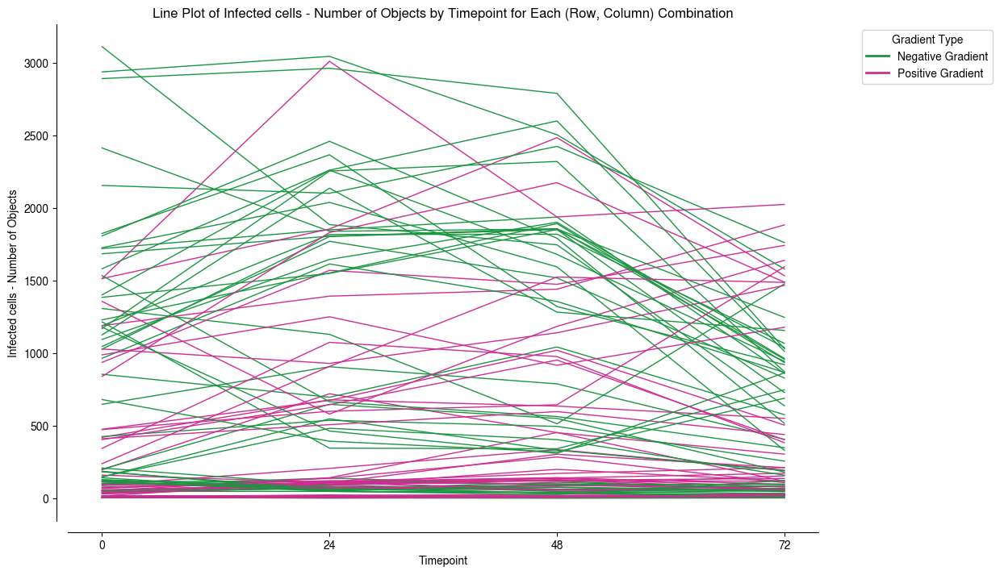

Negative Gradient (Green):
Row 1, Column 2, Row 1, Column 3, Row 1, Column 4, Row 1, Column 5, Row 1, Column 10, Row 1, Column 11, Row 1, Column 12, Row 4, Column 7, Row 4, Column 8, Row 5, Column 2, Row 5, Column 4, Row 5, Column 5, Row 5, Column 6, Row 5, Column 10, Row 5, Column 11, Row 5, Column 12, Row 7, Column 5, Row 8, Column 2, Row 8, Column 3, Row 8, Column 5, Row 8, Column 7, Row 8, Column 9

Positive Gradient (Pink):
Row 1, Column 1, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8, Row 1, Column 9, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, 

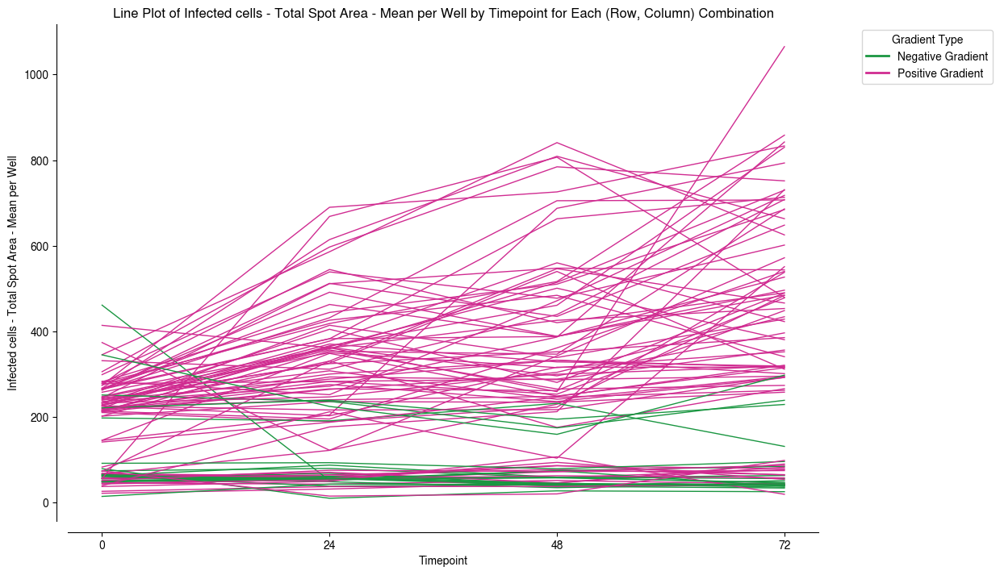

Negative Gradient (Green):
Row 1, Column 1, Row 1, Column 2, Row 1, Column 3, Row 1, Column 4, Row 1, Column 5, Row 1, Column 6, Row 1, Column 7, Row 1, Column 9, Row 1, Column 10, Row 1, Column 11, Row 1, Column 12, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 10, Row 2, Column 11, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 11, Row 4, Column 1, Row 4, Column 5, Row 4, Column 6, Row 4, Column 7, Row 4, Column 8, Row 4, Column 9, Row 4, Column 11, Row 5, Column 2, Row 5, Column 3, Row 5, Column 4, Row 5, Column 5, Row 5, Column 6, Row 5, Column 7, Row 5, Column 10, Row 5, Column 11, Row 5, Column 12, Row 6, Column 5, Row 7, Column 5, Row 8, Column 3, Row 8, Column 5, Row 8, Column 7

Positive Gradient (Pink):
Row 1, Column 8, Row 2, Column 1, Row 2, Column 2, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 12, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, R

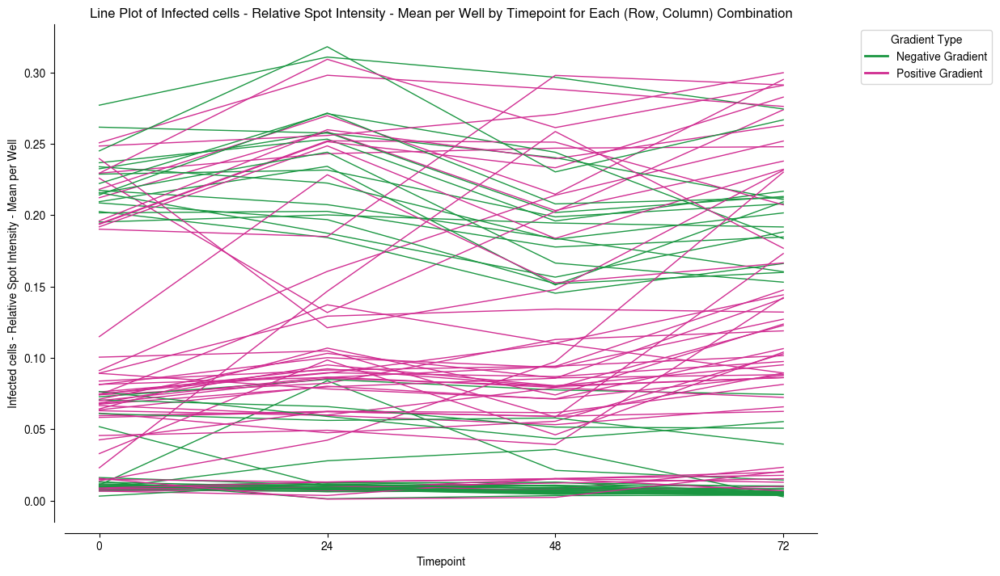

Negative Gradient (Green):
Row 1, Column 2, Row 1, Column 4, Row 1, Column 5, Row 1, Column 11, Row 1, Column 12, Row 4, Column 7, Row 4, Column 8, Row 5, Column 6, Row 5, Column 11, Row 5, Column 12, Row 7, Column 5, Row 8, Column 7, Row 8, Column 9

Positive Gradient (Pink):
Row 1, Column 1, Row 1, Column 3, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8, Row 1, Column 9, Row 1, Column 10, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, Row 4, Column 5, Row 4, Column 6, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 4, Column 12, Row 5, Column 1

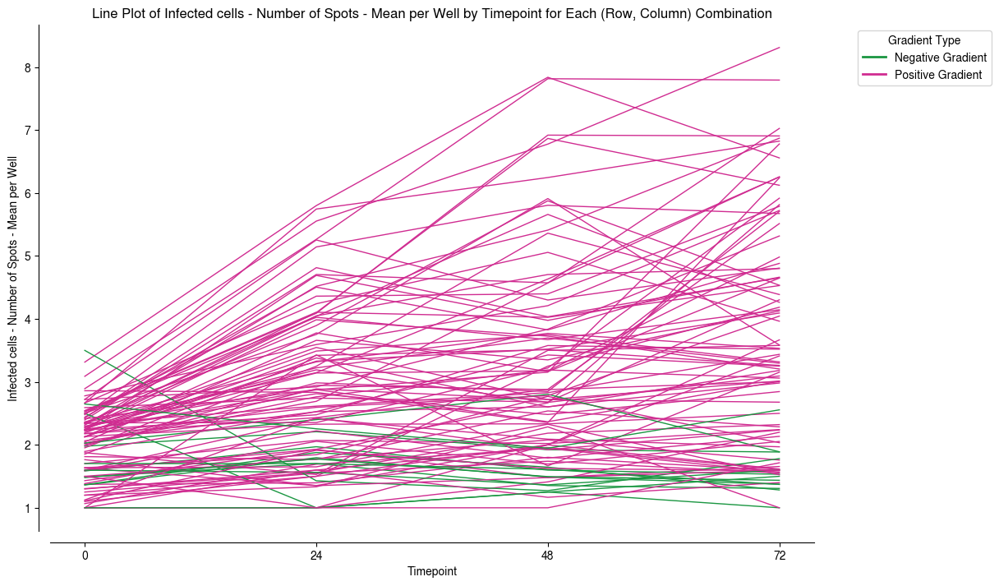

Negative Gradient (Green):
Row 1, Column 1, Row 1, Column 2, Row 1, Column 3, Row 1, Column 4, Row 1, Column 5, Row 1, Column 6, Row 1, Column 8, Row 1, Column 9, Row 1, Column 10, Row 1, Column 11, Row 1, Column 12, Row 2, Column 6, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 11, Row 4, Column 1, Row 4, Column 5, Row 4, Column 7, Row 4, Column 8, Row 4, Column 9, Row 5, Column 1, Row 5, Column 2, Row 5, Column 3, Row 5, Column 4, Row 5, Column 5, Row 5, Column 6, Row 5, Column 7, Row 5, Column 8, Row 5, Column 9, Row 5, Column 10, Row 5, Column 11, Row 5, Column 12, Row 6, Column 5, Row 7, Column 3, Row 7, Column 4, Row 7, Column 5, Row 7, Column 12, Row 8, Column 1, Row 8, Column 3, Row 8, Column 5, Row 8, Column 7, Row 8, Column 8

Positive Gradient (Pink):
Row 1, Column 7, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, R

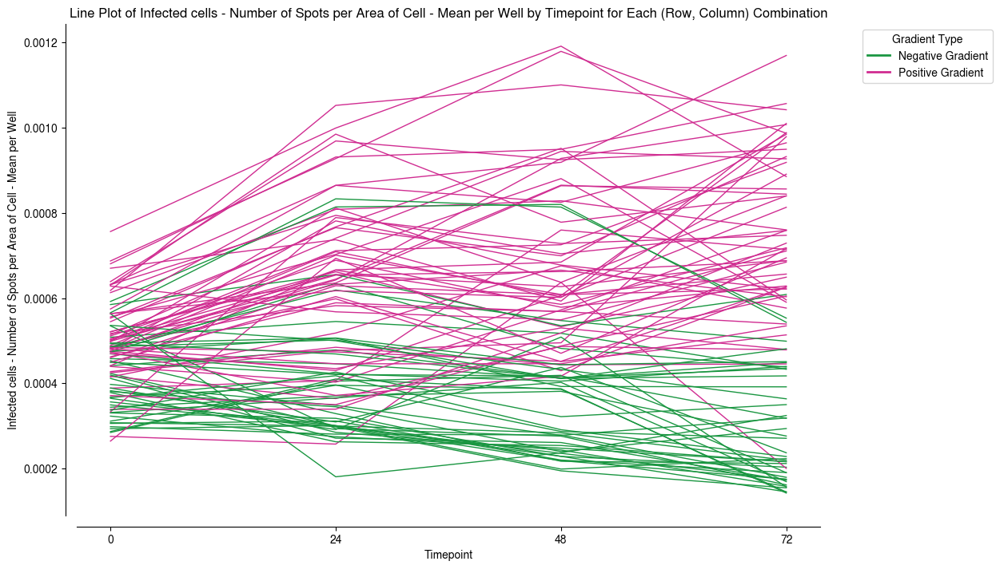

Negative Gradient (Green):
Row 1, Column 1, Row 1, Column 2, Row 1, Column 3, Row 1, Column 4, Row 1, Column 7, Row 1, Column 8, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, Row 4, Column 5, Row 4, Column 6, Row 4, Column 7, Row 4, Column 8, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 4, Column 12, Row 5, Column 1, Row 5, Column 2, Row 5, Column 3, Row 5, Column 4, Row 5, Column 7, Row 5, Column 8, Row 6, Column 1, Row 6, Column 2, Row 6, Column 3, Row 6, Column 4, Row 6, Column 5, Row 6, Column 6, Row 6, Column 7, Row 6, Column 8, Row 6, Colum

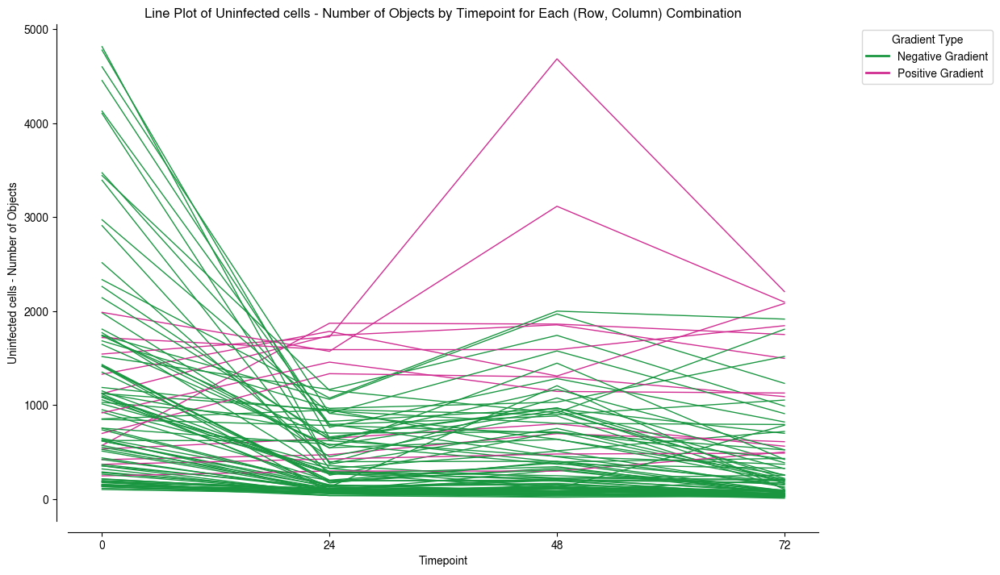

Negative Gradient (Green):
Row 1, Column 1, Row 1, Column 2, Row 1, Column 3, Row 1, Column 4, Row 1, Column 5, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8, Row 1, Column 9, Row 1, Column 10, Row 1, Column 11, Row 1, Column 12, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, Row 4, Column 5, Row 4, Column 6, Row 4, Column 7, Row 4, Column 8, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 4, Column 12, Row 5, Column 1, Row 5, Column 2, Row 5, Column 3, Row 5, Column 4, Row 5, Column 5, Row 5, Column 6, Row 5, Column 7, Row 5, Column 8, Row 5, Co

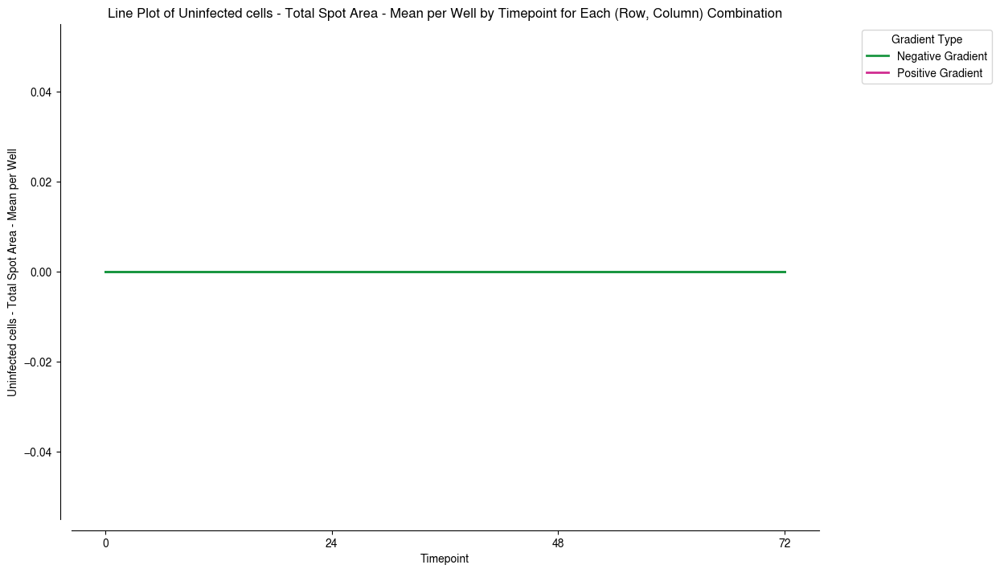

Negative Gradient (Green):
Row 1, Column 1, Row 1, Column 2, Row 1, Column 3, Row 1, Column 4, Row 1, Column 5, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8, Row 1, Column 9, Row 1, Column 10, Row 1, Column 11, Row 1, Column 12, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, Row 4, Column 5, Row 4, Column 6, Row 4, Column 7, Row 4, Column 8, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 4, Column 12, Row 5, Column 1, Row 5, Column 2, Row 5, Column 3, Row 5, Column 4, Row 5, Column 5, Row 5, Column 6, Row 5, Column 7, Row 5, Column 8, Row 5, Co

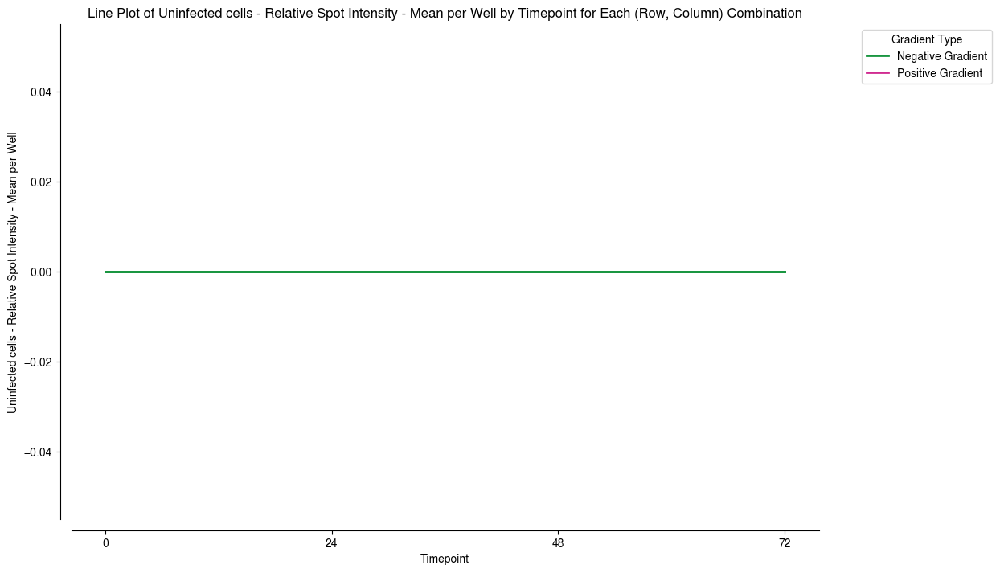

Negative Gradient (Green):
Row 1, Column 1, Row 1, Column 2, Row 1, Column 3, Row 1, Column 4, Row 1, Column 5, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8, Row 1, Column 9, Row 1, Column 10, Row 1, Column 11, Row 1, Column 12, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, Row 4, Column 5, Row 4, Column 6, Row 4, Column 7, Row 4, Column 8, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 4, Column 12, Row 5, Column 1, Row 5, Column 2, Row 5, Column 3, Row 5, Column 4, Row 5, Column 5, Row 5, Column 6, Row 5, Column 7, Row 5, Column 8, Row 5, Co

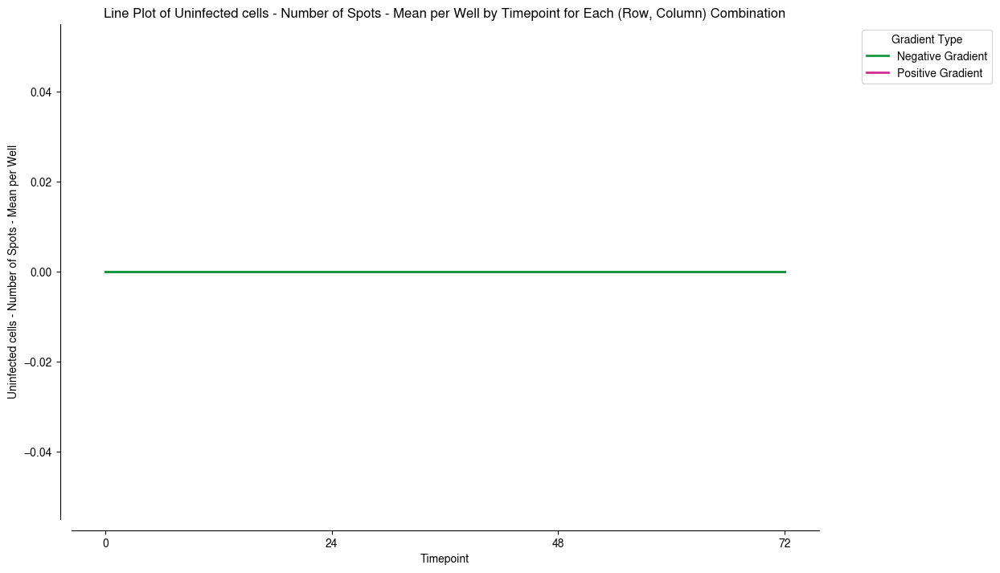

Negative Gradient (Green):
Row 1, Column 1, Row 1, Column 2, Row 1, Column 3, Row 1, Column 4, Row 1, Column 5, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8, Row 1, Column 9, Row 1, Column 10, Row 1, Column 11, Row 1, Column 12, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, Row 4, Column 5, Row 4, Column 6, Row 4, Column 7, Row 4, Column 8, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 4, Column 12, Row 5, Column 1, Row 5, Column 2, Row 5, Column 3, Row 5, Column 4, Row 5, Column 5, Row 5, Column 6, Row 5, Column 7, Row 5, Column 8, Row 5, Co

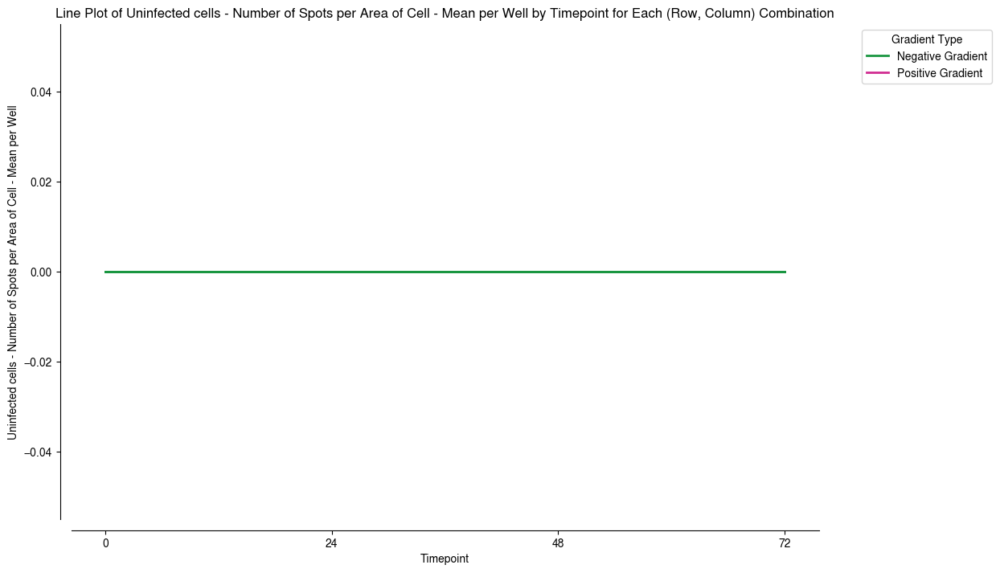

Negative Gradient (Green):
Row 1, Column 1, Row 1, Column 2, Row 1, Column 3, Row 1, Column 4, Row 1, Column 5, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8, Row 1, Column 9, Row 1, Column 10, Row 1, Column 11, Row 1, Column 12, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, Row 4, Column 5, Row 4, Column 6, Row 4, Column 7, Row 4, Column 8, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 4, Column 12, Row 5, Column 1, Row 5, Column 2, Row 5, Column 3, Row 5, Column 4, Row 5, Column 5, Row 5, Column 6, Row 5, Column 7, Row 5, Column 8, Row 5, Co

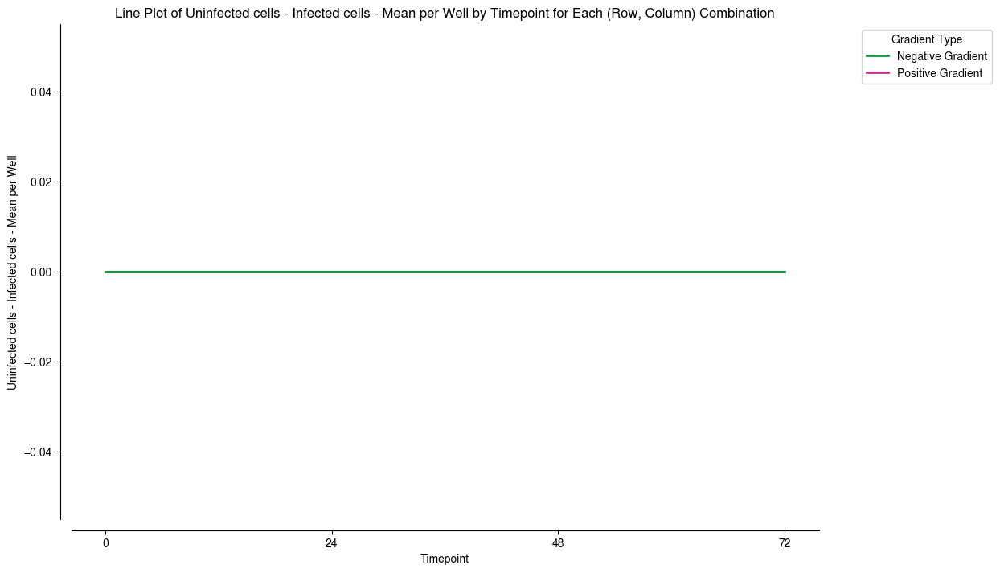

Negative Gradient (Green):
Row 1, Column 1, Row 1, Column 2, Row 1, Column 3, Row 1, Column 4, Row 1, Column 7, Row 1, Column 8, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, Row 4, Column 5, Row 4, Column 6, Row 4, Column 7, Row 4, Column 8, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 4, Column 12, Row 5, Column 1, Row 5, Column 2, Row 5, Column 3, Row 5, Column 4, Row 5, Column 7, Row 5, Column 8, Row 6, Column 1, Row 6, Column 2, Row 6, Column 3, Row 6, Column 4, Row 6, Column 5, Row 6, Column 6, Row 6, Column 7, Row 6, Column 8, Row 6, Colum

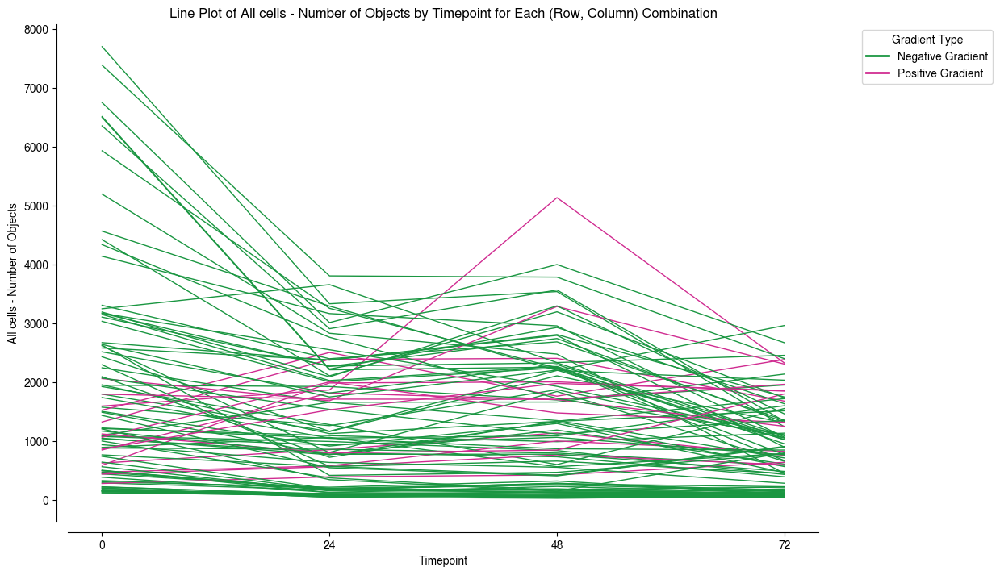

Negative Gradient (Green):
Row 1, Column 2, Row 1, Column 4, Row 1, Column 5, Row 1, Column 11, Row 1, Column 12, Row 4, Column 7, Row 5, Column 4, Row 5, Column 6, Row 5, Column 11, Row 5, Column 12, Row 8, Column 2

Positive Gradient (Pink):
Row 1, Column 1, Row 1, Column 3, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8, Row 1, Column 9, Row 1, Column 10, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, Row 4, Column 5, Row 4, Column 6, Row 4, Column 8, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 4, Column 12, Row 5, Column 1, Row 5, Column 2

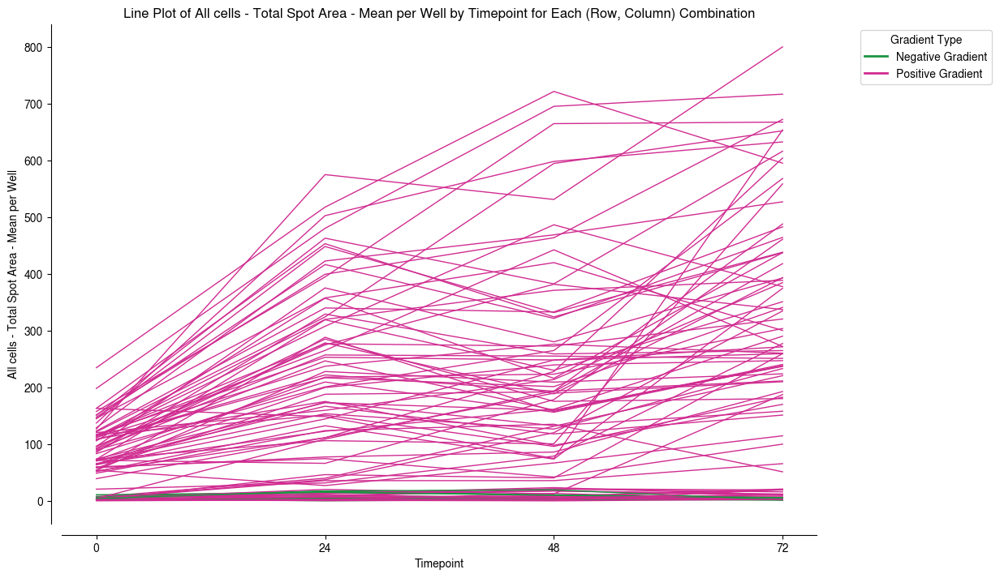

Negative Gradient (Green):
Row 1, Column 2, Row 1, Column 4, Row 1, Column 5, Row 1, Column 11, Row 1, Column 12, Row 4, Column 5, Row 4, Column 7, Row 4, Column 9, Row 5, Column 4, Row 5, Column 6, Row 5, Column 10, Row 5, Column 11, Row 5, Column 12, Row 7, Column 5, Row 8, Column 3

Positive Gradient (Pink):
Row 1, Column 1, Row 1, Column 3, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8, Row 1, Column 9, Row 1, Column 10, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, Row 4, Column 6, Row 4, Column 8, Row 4, Column 10, Row 4, Column 11, Row 4, Column 1

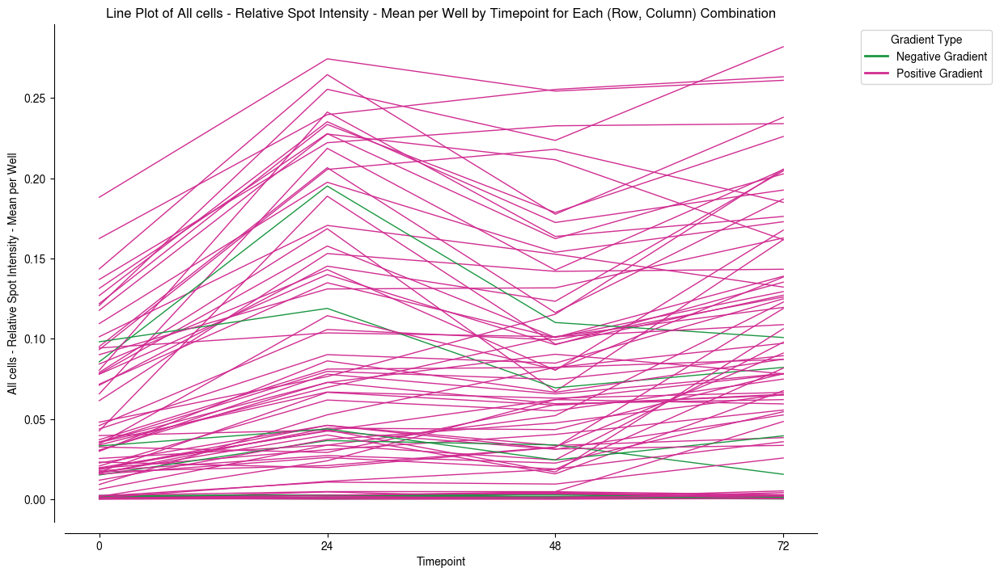

Negative Gradient (Green):
Row 8, Column 9

Positive Gradient (Pink):
Row 1, Column 1, Row 1, Column 2, Row 1, Column 3, Row 1, Column 4, Row 1, Column 5, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8, Row 1, Column 9, Row 1, Column 10, Row 1, Column 11, Row 1, Column 12, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 11, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, Row 4, Column 5, Row 4, Column 6, Row 4, Column 7, Row 4, Column 8, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 4, Column 12, Row 5, Column 1, Row 5, Column 2, Row 5, Column 3, Row 5, Column 4, Row 5, Column 5, Row 5, Column 6, 

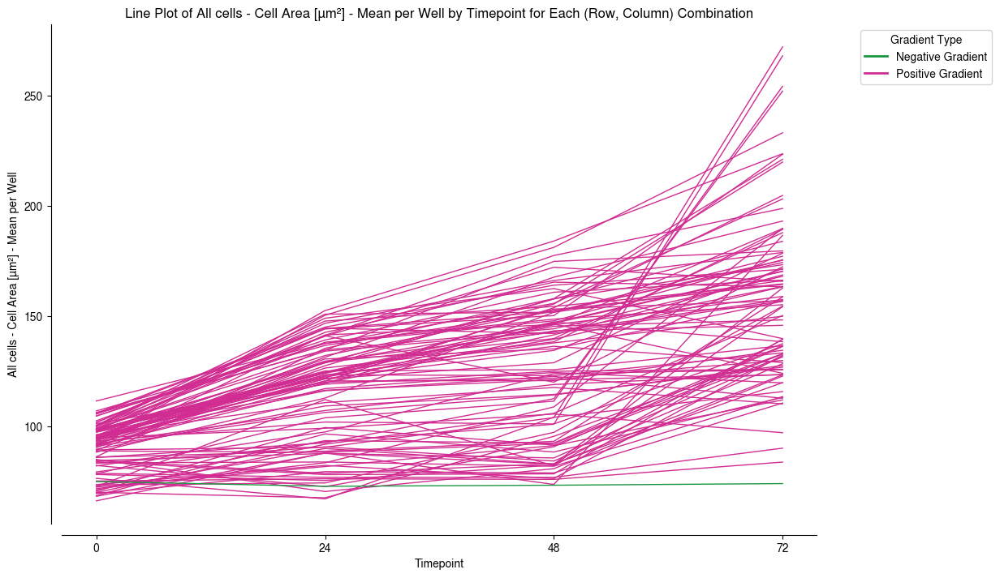

Negative Gradient (Green):
Row 1, Column 1, Row 1, Column 2, Row 1, Column 3, Row 1, Column 4, Row 1, Column 5, Row 1, Column 6, Row 1, Column 7, Row 1, Column 8, Row 1, Column 9, Row 1, Column 10, Row 1, Column 11, Row 1, Column 12, Row 2, Column 1, Row 2, Column 2, Row 2, Column 3, Row 2, Column 4, Row 2, Column 5, Row 2, Column 6, Row 2, Column 7, Row 2, Column 8, Row 2, Column 9, Row 2, Column 10, Row 2, Column 12, Row 3, Column 1, Row 3, Column 2, Row 3, Column 3, Row 3, Column 4, Row 3, Column 5, Row 3, Column 6, Row 3, Column 7, Row 3, Column 8, Row 3, Column 9, Row 3, Column 10, Row 3, Column 11, Row 3, Column 12, Row 4, Column 1, Row 4, Column 2, Row 4, Column 3, Row 4, Column 4, Row 4, Column 5, Row 4, Column 7, Row 4, Column 8, Row 4, Column 9, Row 4, Column 10, Row 4, Column 11, Row 5, Column 1, Row 5, Column 2, Row 5, Column 3, Row 5, Column 4, Row 5, Column 5, Row 5, Column 6, Row 5, Column 7, Row 5, Column 8, Row 5, Column 9, Row 5, Column 10, Row 5, Column 11, Row 5, Co

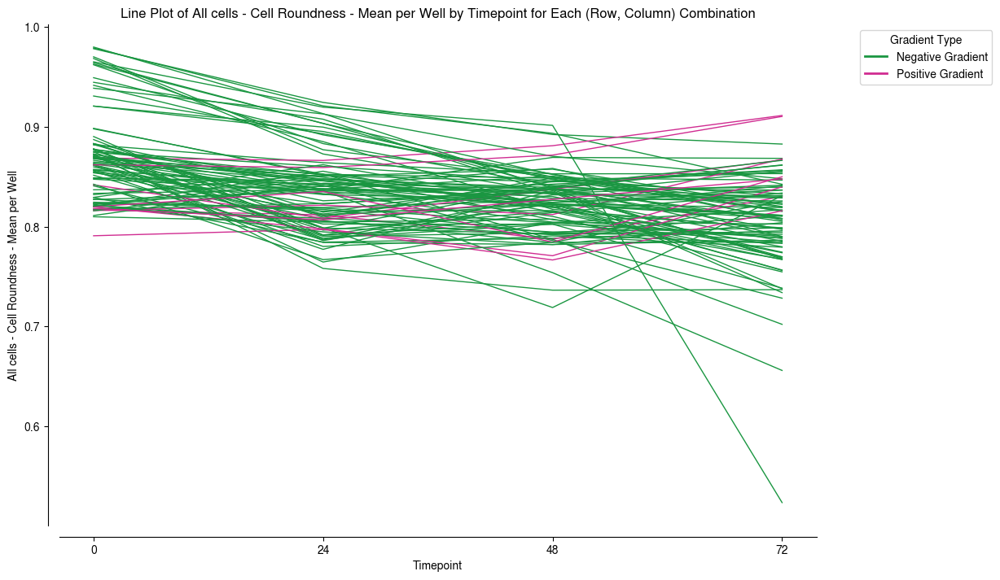

In [58]:
import matplotlib.lines as mlines

for param in params:
    # Store the tuples for legend creation
    positive_slope_tuples = []
    negative_slope_tuples = []
    
    # Create the line plot
    plt.figure(figsize=(12, 8))
    
    # Loop through each unique (Row, Column) combination and plot a line
    for (row, column), subset_df in df.groupby(['Row', 'Column']):
        
        # Perform linear regression to find the slope of "All cells - Cell Roundness - Mean per Well" over time
        slope, _, _, _, _ = linregress(subset_df['Timepoint'], subset_df[param])
        
        # Determine color based on the slope
        if slope > 0:
            color = expanded_piyg[-1]  # Positive slope: pink
            positive_slope_tuples.append(f'Row {row}, Column {column}')
        else:
            color = expanded_piyg[0]   # Negative slope: green
            negative_slope_tuples.append(f'Row {row}, Column {column}')
        
        sns.lineplot(
            data=subset_df,
            x='Timepoint',
            y=param,
            color=color,
            linewidth=1
        )
    
    # Add labels and title
    plt.xlabel('Timepoint')
    plt.ylabel(param)
    plt.title(f'Line Plot of {param} by Timepoint for Each (Row, Column) Combination')
    
    # Set x-axis labels to only show the unique Timepoint values present in the data
    unique_timepoints = sorted(df['Timepoint'].unique())
    plt.xticks(ticks=unique_timepoints)
    
    # Create custom legend
    green_line = mlines.Line2D([], [], color=expanded_piyg[0], label='Negative Gradient', linewidth=2)
    pink_line = mlines.Line2D([], [], color=expanded_piyg[-1], label='Positive Gradient', linewidth=2)
    
    # Add the custom legend
    plt.legend(handles=[green_line, pink_line], title='Gradient Type', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Print the row-column tuples
    print("Negative Gradient (Green):")
    print(", ".join(negative_slope_tuples))
    
    print("\nPositive Gradient (Pink):")
    print(", ".join(positive_slope_tuples))
    
    sns.despine(offset=10)
    
    # Show the plot
    plt.show()


In [ ]:

for param in params:
    # Store the tuples for legend creation
    positive_slope_tuples = []
    negative_slope_tuples = []
    
    # Create the line plot
    plt.figure(figsize=(12, 8))
    
    # Loop through each unique (Row, Column) combination and plot a line
    for (row, column), subset_df in df.groupby(['Row', 'Column']):
        
        # Perform linear regression to find the slope of "All cells - Cell Roundness - Mean per Well" over time
        slope, _, _, _, _ = linregress(subset_df['Timepoint'], subset_df[param])
        
        # Determine color based on the slope
        if slope > 0:
            color = expanded_piyg[-1]  # Positive slope: pink
            positive_slope_tuples.append(f'Row {row}, Column {column}')
        else:
            color = expanded_piyg[0]   # Negative slope: green
            negative_slope_tuples.append(f'Row {row}, Column {column}')
        
        sns.lineplot(
            data=subset_df,
            x='Timepoint',
            y=param,
            color=color,
            linewidth=1
        )
    
    # Add labels and title
    plt.xlabel('Timepoint')
    plt.ylabel(param)
    plt.title(f'Line Plot of {param} by Timepoint for Each (Row, Column) Combination')
    
    # Set x-axis labels to only show the unique Timepoint values present in the data
    unique_timepoints = sorted(df['Timepoint'].unique())
    plt.xticks(ticks=unique_timepoints)
    
    # Create custom legend
    green_line = mlines.Line2D([], [], color=expanded_piyg[0], label='Negative Gradient', linewidth=2)
    pink_line = mlines.Line2D([], [], color=expanded_piyg[-1], label='Positive Gradient', linewidth=2)
    
    # Add the custom legend
    plt.legend(handles=[green_line, pink_line], title='Gradient Type', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Print the row-column tuples
    print("Negative Gradient (Green):")
    print(", ".join(negative_slope_tuples))
    
    print("\nPositive Gradient (Pink):")
    print(", ".join(positive_slope_tuples))
    
    sns.despine(offset=10)
    
    # Show the plot
    plt.show()


In [71]:
param = params[0]

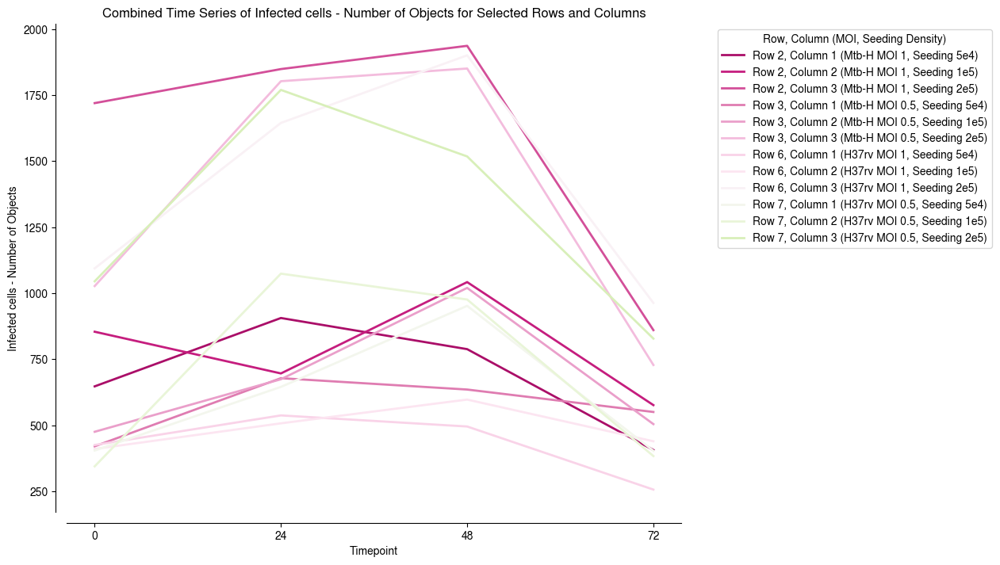

In [86]:

# Mapping of columns to seeding densities
seeding_density_mapping = {1: '5e4', 2: '1e5', 3: '2e5'}

# Mapping of rows to MOI values
moi_mapping = {2: 'Mtb-H MOI 1', 3: 'Mtb-H MOI 0.5', 6: 'H37rv MOI 1', 7: 'H37rv MOI 0.5', }

# Create the line plot
plt.figure(figsize=(10, 8))

# Initialize a color index
color_index = 0

# Loop through each row and column combination and plot the series
for row in [2, 3,  6, 7]:
    for column in [1, 2, 3]: #4, 6, 7]:
        # Filter the subset DataFrame for the current row and column
        subset_df = df[(df['Row'] == row) & (df['Column'] == column)]
        
        # Determine seeding density and MOI labels
        seeding_density = seeding_density_mapping.get(column, 'Unknown')
        moi_value = moi_mapping.get(row, 'Unknown')
        
        # Plot the line
        sns.lineplot(
            data=subset_df,
            x='Timepoint',
            y=param,
            color=color_palette[color_index],  # Use the current color
            linewidth=2,
            label=f'Row {row}, Column {column} ({moi_value}, Seeding density {seeding_density})'
        )
        
        # Increment the color index
        color_index += 1

# Add labels and title
plt.xlabel('Timepoint')
plt.ylabel(param)
plt.title(f'Combined Time Series of {param} for Selected Rows and Columns')

# Set x-axis labels to only show the unique Timepoint values present in the data
unique_timepoints = sorted(df['Timepoint'].unique())
plt.xticks(ticks=unique_timepoints)

# Add a legend
plt.legend(title='Row, Column (MOI, Seeding Density)', bbox_to_anchor=(1.05, 1), loc='upper left')

sns.despine(offset=10)

# Show the plot
plt.show()

In [6]:
output_dir = '/run/user/30046150/gvfs/smb-share:server=ds3617xs.local,share=opera2/Baptiste/Leo-datas/Leo_data/240902_moi1_72h_cy5cy3dapi&alex488__2024-09-03T13_26_42-Measurement 1/analysis'


In [129]:
params = ['Mtb - Number of Objects',
           'Infected cells - Number of Objects',
           'Infected cells - Total Spot Area - Mean per Well',
           'Infected cells - Relative Spot Intensity - Mean per Well',
           'Infected cells - Number of Spots - Mean per Well',
           'Infected cells - Number of Spots per Area of Cell - Mean per Well',
           'Uninfected cells - Number of Objects',
           'Uninfected cells - Total Spot Area - Mean per Well',
           'Uninfected cells - Relative Spot Intensity - Mean per Well',
           'Uninfected cells - Number of Spots - Mean per Well',
           'Uninfected cells - Number of Spots per Area of Cell - Mean per Well',
           'Uninfected cells - Infected cells - Mean per Well',
           'All cells - Number of Objects',
           'All cells - Total Spot Area - Mean per Well',
           'All cells - Relative Spot Intensity - Mean per Well',
           'All cells - Cell Area [µm²] - Mean per Well',
           'All cells - Cell Roundness - Mean per Well']

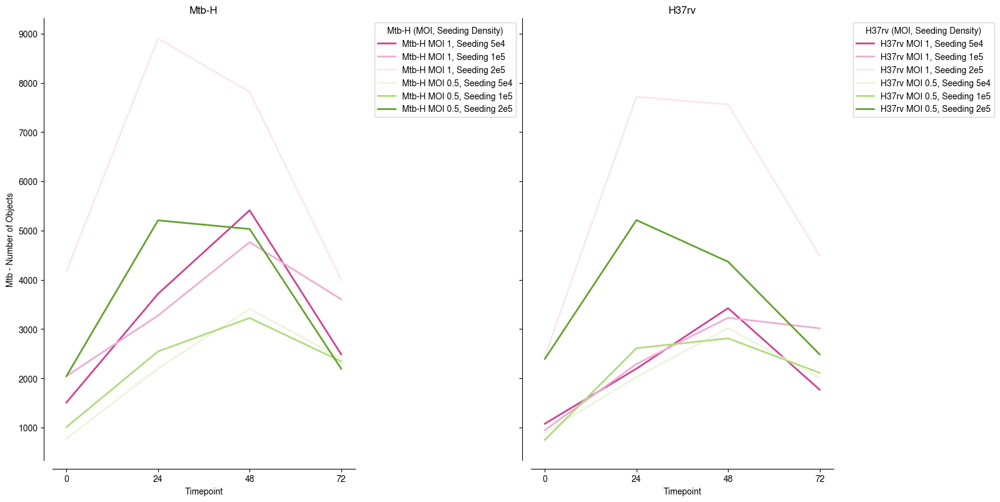

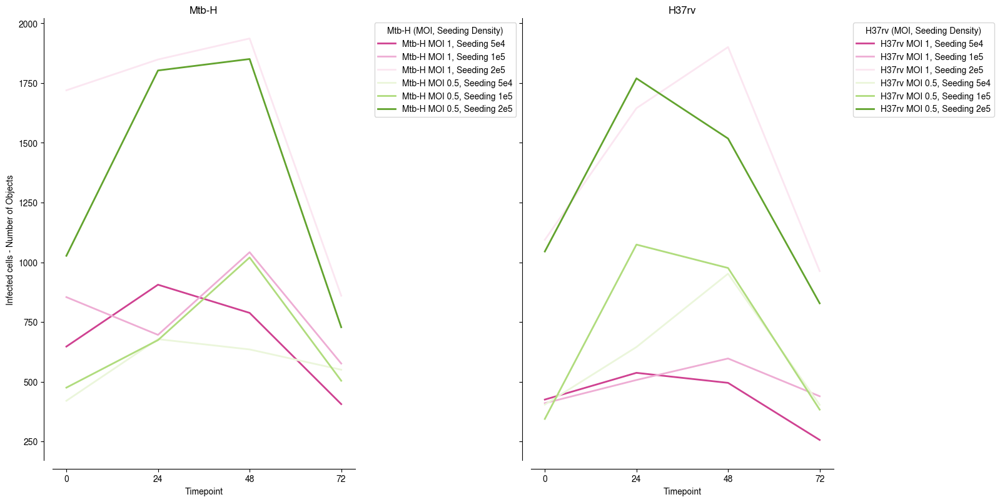

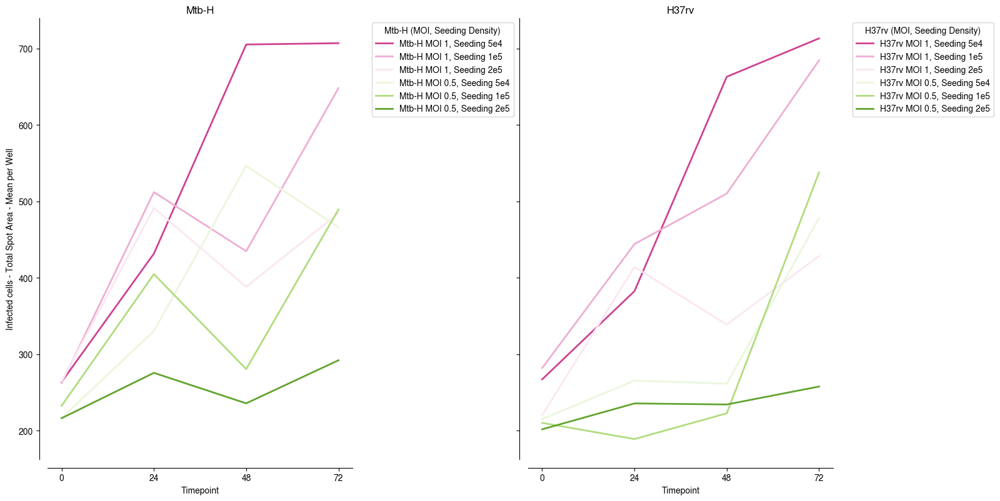

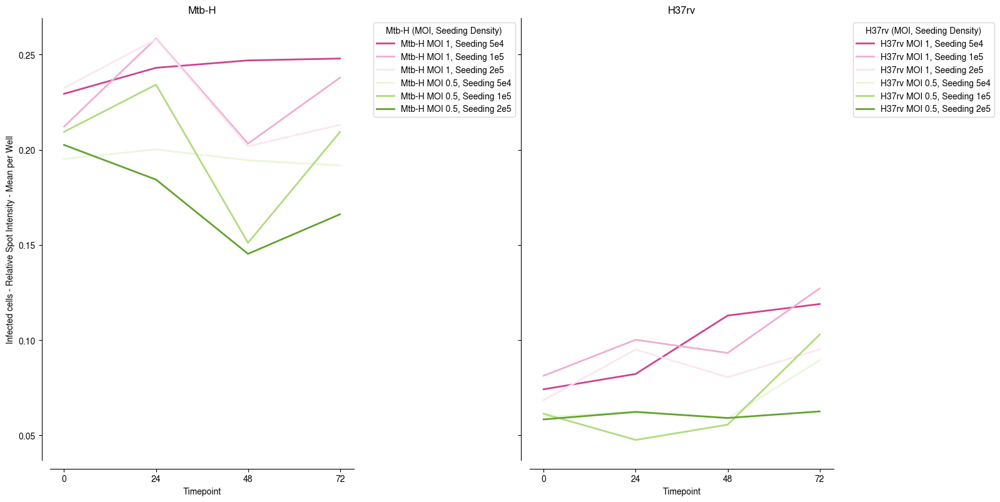

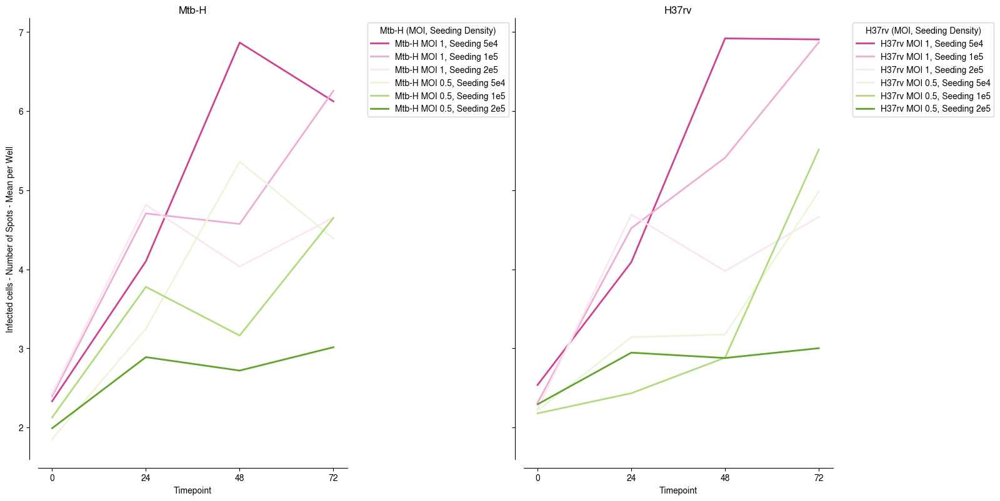

...

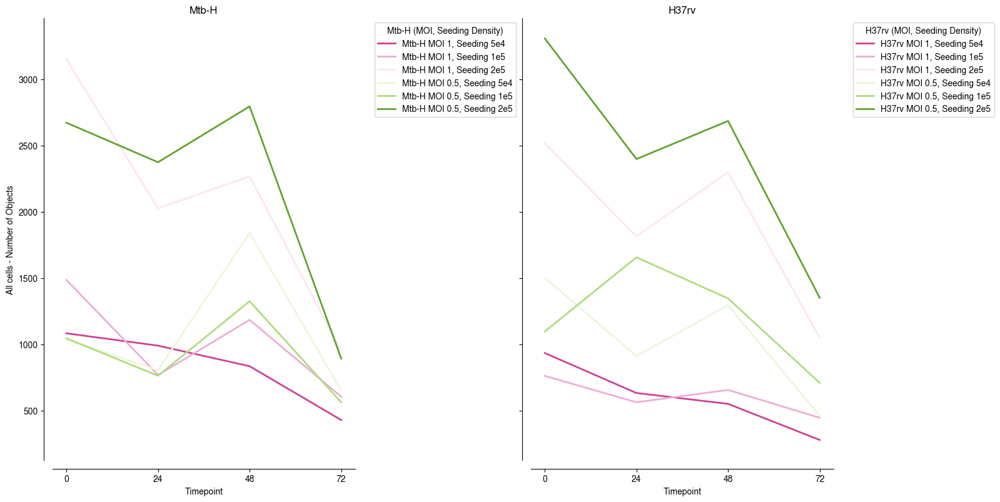

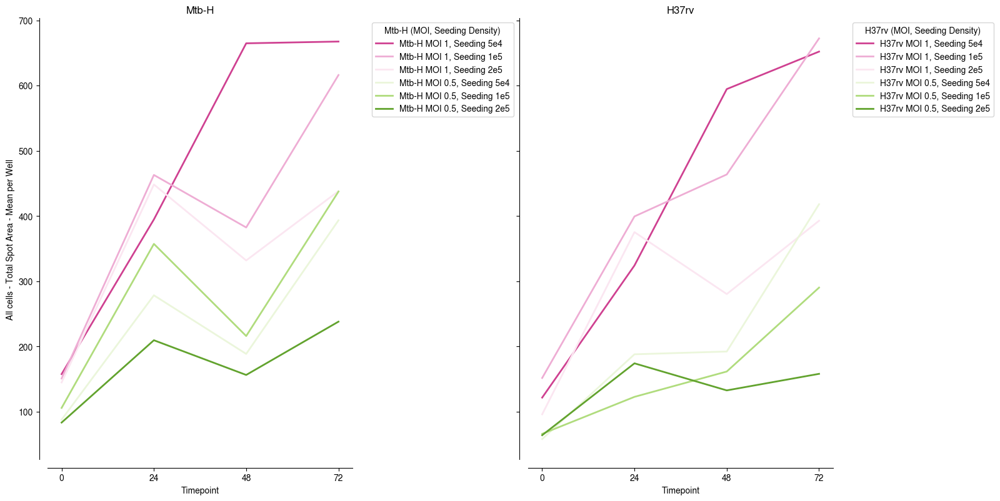

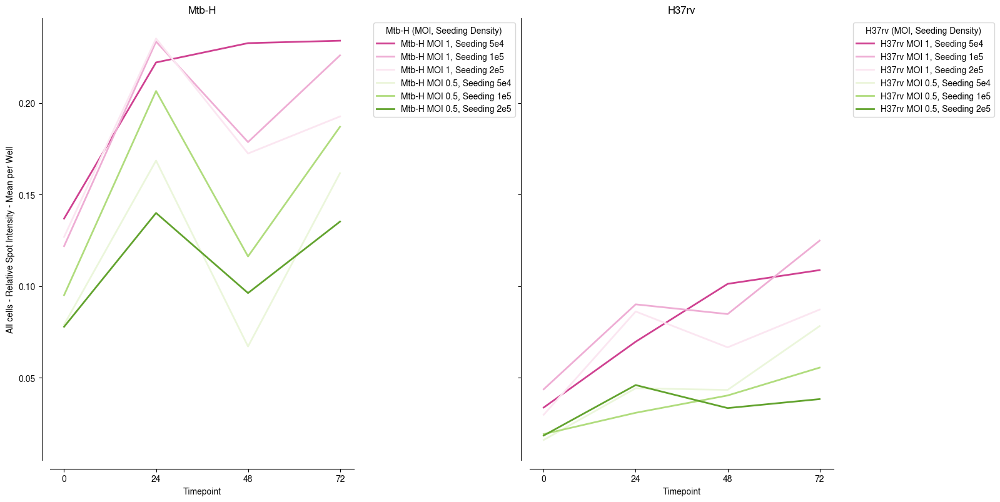

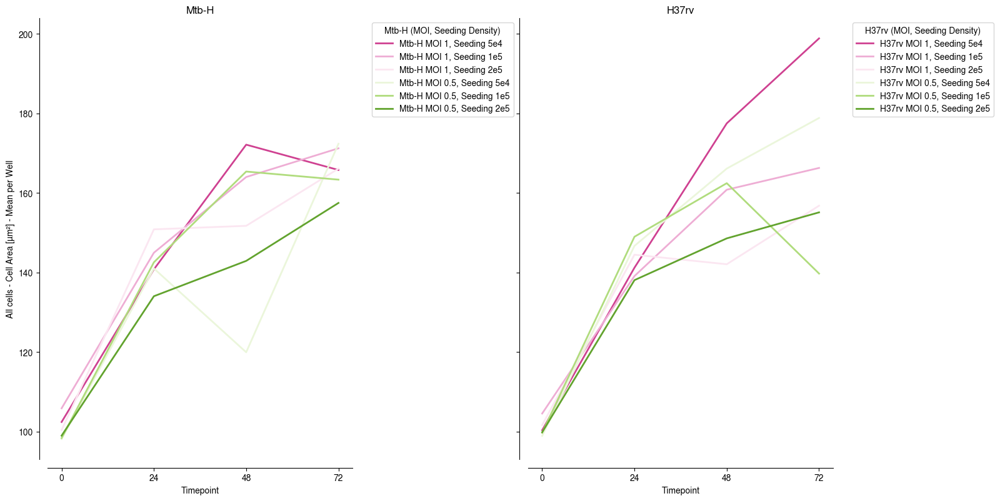

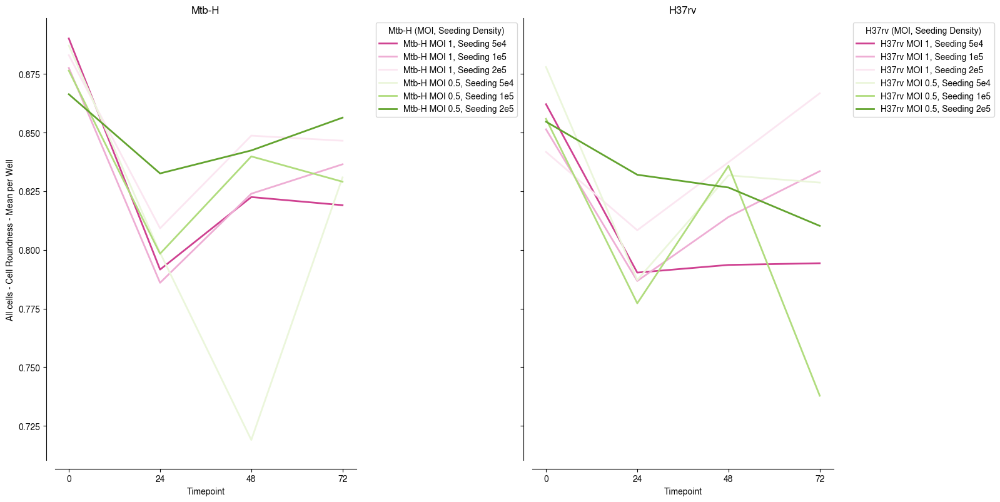

In [91]:
for param in params:

    color_palette = sns.color_palette("PiYG", 6)  # 6 distinct colors for 3 MOIs and 2 seeding densities
   
    # Mapping of columns to seeding densities
    seeding_density_mapping = {1: '5e4', 2: '1e5', 3: '2e5'}
    
    # Mapping of rows to MOI values
    moi_mapping = {2: 'Mtb-H MOI 1', 3: 'Mtb-H MOI 0.5', 6: 'H37rv MOI 1', 7: 'H37rv MOI 0.5'}
    
    # Create subplots: 1 row, 2 columns
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)
    
    # Define Mtb categories
    mtb_h_rows = [2, 3]  # Mtb-H
    h37rv_rows = [6, 7]  # H37rv
    
    # Define a function to plot each category
    def plot_mtb_category(ax, rows, mtb_type, color_palette):
        # Initialize a color index
        color_index = 0
        
        # Loop through each row and column combination and plot the series
        for row in rows:
            for column in [1, 2, 3]:
                # Filter the subset DataFrame for the current row and column
                subset_df = df[(df['Row'] == row) & (df['Column'] == column)]
                
                # Determine seeding density and MOI labels
                seeding_density = seeding_density_mapping.get(column, 'Unknown')
                moi_value = moi_mapping.get(row, 'Unknown')
                
                # Plot the line
                sns.lineplot(
                    data=subset_df,
                    x='Timepoint',
                    y=param,
                    color=color_palette[color_index],  # Use the current color
                    linewidth=2,
                    ax=ax,
                    label=f'{moi_value}, Seeding {seeding_density}'
                )
                
                # Increment the color index
                color_index = (color_index + 1) % len(color_palette)  # Loop colors if needed
    
    # Plot Mtb-H on the left subplot
    plot_mtb_category(axes[0], mtb_h_rows, 'Mtb-H', color_palette)
    axes[0].set_title('Mtb-H')
    axes[0].set_xlabel('Timepoint')
    axes[0].set_ylabel(param)
    
    # Plot H37rv on the right subplot
    plot_mtb_category(axes[1], h37rv_rows, 'H37rv', color_palette)
    axes[1].set_title('H37rv')
    axes[1].set_xlabel('Timepoint')
    
    # Set x-axis labels to only show the unique Timepoint values present in the data
    unique_timepoints = sorted(df['Timepoint'].unique())
    axes[0].set_xticks(unique_timepoints)
    axes[1].set_xticks(unique_timepoints)
    
    # Add legends to each subplot
    axes[0].legend(title='Mtb-H (MOI, Seeding Density)', bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[1].legend(title='H37rv (MOI, Seeding Density)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Adjust layout
    plt.tight_layout()
    sns.despine(offset=10)
    
    

    plt.savefig(os.path.join(output_dir, f'{param}.pdf'),  bbox_inches = 'tight', dpi = 314)

    # Show the plot
    plt.show()

## Round 2

In [103]:
# Define the data for the DataFrame
data = [
    (2, 7, 'Mtb-H', 'None', '1'), (2, 8, 'Mtb-H', 'None', '1'), (2, 9, 'Mtb-H', 'None', '1'),
    (2, 10, 'Mtb-H', 'None', '1'), (2, 11, 'Mtb-H', 'None', '1'), (2, 12, 'Mtb-H', 'None', '1'),
    (3, 7, 'Mtb-H', 'None', '0.5'), (3, 8, 'Mtb-H', 'None', '0.5'), (3, 9, 'Mtb-H', 'None', '0.5'),
    (3, 10, 'Mtb-H', 'None', '0.5'), (3, 11, 'Mtb-H', 'None', '0.5'), (3, 12, 'Mtb-H', 'None', '0.5'),
    (6, 7, 'H37Rv', 'None', '1'), (6, 8, 'H37Rv', 'None', '1'), (6, 9, 'H37Rv', 'None', '1'),
    (6, 10, 'H37Rv', 'None', '1'), (6, 11, 'H37Rv', 'None', '1'), (6, 12, 'H37Rv', 'None', '1'),
    (7, 7, 'H37Rv', 'None', '0.5'), (7, 8, 'H37Rv', 'None', '0.5'), (7, 9, 'H37Rv', 'None', '0.5'),
    (7, 10, 'H37Rv', 'None', '0.5'), (7, 11, 'H37Rv', 'None', '0.5'), (7, 12, 'H37Rv', 'None', '0.5'),
    (4, 7, 'Mtb-H', 'BAFA1', 'None'), (4, 8, 'Mtb-H', 'RAPA', 'None'), (4, 9, 'Mtb-H', 'BAFA1', 'None'),
    (4, 10, 'Mtb-H', 'RAPA', 'None'), (4, 11, 'Mtb-H', 'BAFA1', 'None'), (4, 12, 'Mtb-H', 'RAPA', 'None'),
    (8, 7, 'H37Rv', 'BAFA1', 'None'), (8, 8, 'H37Rv', 'RAPA', 'None'), (8, 9, 'H37Rv', 'BAFA1', 'None'),
    (8, 10, 'H37Rv', 'RAPA', 'None'), (8, 11, 'H37Rv', 'BAFA1', 'None'), (8, 12, 'H37Rv', 'RAPA', 'None'),
    (4, 1, 'Mtb-H', 'BAFA1', 'None'), (4, 2, 'Mtb-H', 'RAPA', 'None'), (4, 3, 'Mtb-H', 'BAFA1', 'None'),
    (4, 4, 'Mtb-H', 'RAPA', 'None'), (4, 5, 'Mtb-H', 'BAFA1', 'None'), (4, 6, 'Mtb-H', 'RAPA', 'None'),
    (8, 1, 'H37Rv', 'BAFA1', 'None'), (8, 2, 'H37Rv', 'RAPA', 'None'), (8, 3, 'H37Rv', 'BAFA1', 'None'),
    (8, 4, 'H37Rv', 'RAPA', 'None'), (8, 5, 'H37Rv', 'BAFA1', 'None'), (8, 6, 'H37Rv', 'RAPA', 'None')
]

# Create the DataFrame
metadata_df = pd.DataFrame(data, columns=['Row', 'Column', 'Strain', 'Treatment', 'MOI'])

In [104]:
# Mapping of columns to seeding densities
seeding_density_mapping = {1: 5E4, 2: 1E5, 3: 2e5}
# Add 'Seeding Density' column to the existing DataFrame based on the column number
metadata_df['Seeding Density'] = metadata_df['Column'].map(lambda x: seeding_density_mapping.get(x, 'Unknown'))


In [53]:
# Mapping of rows to MOI values
moi2_mapping = {2: 1, 3: 0.5, 6: 1, 7: 0.5}
# Add 'MOI2' column to the existing DataFrame based on the column number
metadata_df['MOI2'] = metadata_df['Row'].map(lambda x: moi2_mapping.get(x, 'Unknown'))


In [54]:
# Mapping of rows to strain values
strain2_mapping = {2: 'Mtb-H', 3: 'Mtb-H', 6: 'H37rv', 7: 'H37rv'}
# Add 'strain2' column to the existing DataFrame based on the column number
metadata_df['Strain2'] = metadata_df['Row'].map(lambda x: strain2_mapping.get(x, 'Unknown'))


### both previous versions match so deleting those columns

In [56]:
del metadata_df['MOI2']
del metadata_df['Strain2']

In [105]:
metadata_df

,Row,Column,Strain,Treatment,MOI,Seeding Density
0,2,7,Mtb-H,None,1,Unknown
1,2,8,Mtb-H,None,1,Unknown
2,2,9,Mtb-H,None,1,Unknown
3,2,10,Mtb-H,None,1,Unknown
4,2,11,Mtb-H,None,1,Unknown
5,2,12,Mtb-H,None,1,Unknown
6,3,7,Mtb-H,None,0.5,Unknown
7,3,8,Mtb-H,None,0.5,Unknown
8,3,9,Mtb-H,None,0.5,Unknown
9,3,10,Mtb-H,None,0.5,Unknown


In [109]:
# Merging metadata_df with the main df on 'Row' and 'Column'
df = pd.merge(df, metadata_df, on=['Row', 'Column'], how='left')
# Replace 'None' and 'Unknown' with NaN
df.replace([np.nan, 'Unknown'], '', inplace=True)


In [121]:
df

,Row,Column,Timepoint,Nuclei - Number of Objects,Nuclei - All cells - Mean per Well,Mtb - Number of Objects,Infected cells - Number of Objects,Infected cells - Total Spot Area - Mean per Well,Infected cells - Relative Spot Intensity - Mean per Well,Infected cells - Number of Spots - Mean per Well,...,Time [s],Compound,Concentration,Cell Type,Cell Count,Unnamed: 28,Strain,Treatment,MOI,Seeding Density
0,1,1,48,628,0.893312,97,48,58.416667,0.009309,2.020833,...,0,,,,,,,,,
1,1,2,48,1136,0.868838,173,90,57.988889,0.006545,1.922222,...,0,,,,,,,,,
2,1,3,48,2102,0.890105,191,129,38.992248,0.004863,1.48062,...,0,,,,,,,,,
3,1,4,48,2414,0.872825,219,137,42.437956,0.005492,1.59854,...,0,,,,,,,,,
4,1,5,48,5776,0.889543,613,453,37.816777,0.005974,1.353201,...,0,,,,,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
379,8,8,24,112,0.910714,2,2,15.0,0.001156,1.0,...,0,,,,,,H37Rv,RAPA,,
380,8,9,24,174,0.954023,124,55,224.527273,0.078317,2.254545,...,0,,,,,,H37Rv,BAFA1,,
381,8,10,24,160,0.937500,122,47,246.765957,0.08667,2.595745,...,0,,,,,,H37Rv,RAPA,,
382,8,11,24,605,0.899174,1582,393,350.208651,0.092418,4.025445,...,0,,,,,,H37Rv,BAFA1,,


In [111]:
# Define a function to plot each category
def plot_mtb_category(ax, rows, mtb_type, color_palette):
    # Initialize a color index
    color_index = 0
    
    # Loop through each row and column combination and plot the series
    for row in rows:
        for column in columns:
            # Filter the subset DataFrame for the current row and column
            subset_df = df[(df['Row'] == row) & (df['Column'] == column)]
            
            # Determine seeding density and MOI labels
            seeding_density = subset_df['Seeding Density'].iloc[0]
            moi_value = subset_df['MOI'].iloc[0]
            treatment = subset_df['Treatment'].iloc[0]
            strain = subset_df['Strain'].iloc[0]
            
            # Plot the line
            sns.lineplot(
                data=subset_df,
                x='Timepoint',
                y=param,
                color=color_palette[color_index],  # Use the current color
                linewidth=2,
                ax=ax,
                label=f'{moi_value}, Seeding {seeding_density}'
            )
            
            # Increment the color index
            color_index = (color_index + 1) % len(color_palette)  # Loop colors if needed

In [122]:
subset_df = df[(df['Row'] == row) & (df['Column'] == column)]

In [124]:
 subset_df['Seeding Density'].iloc[0]

''

In [123]:
subset_df

,Row,Column,Timepoint,Nuclei - Number of Objects,Nuclei - All cells - Mean per Well,Mtb - Number of Objects,Infected cells - Number of Objects,Infected cells - Total Spot Area - Mean per Well,Infected cells - Relative Spot Intensity - Mean per Well,Infected cells - Number of Spots - Mean per Well,...,Time [s],Compound,Concentration,Cell Type,Cell Count,Unnamed: 28,Strain,Treatment,MOI,Seeding Density
18,2,7,48,31,1.000000,18,9,229.666667,0.202633,2.0,...,0,,,,,,Mtb-H,,1,
114,2,7,72,41,0.926829,33,9,484.0,0.273811,3.666667,...,0,,,,,,Mtb-H,,1,
210,2,7,0,133,0.887218,30,17,373.823529,0.22588,1.764706,...,0,,,,,,Mtb-H,,1,
306,2,7,24,83,0.927711,23,17,122.176471,0.13184,1.352941,...,0,,,,,,Mtb-H,,1,


In [133]:
import seaborn as sns

In [136]:
output_dir  = '/run/user/30046150/gvfs/smb-share:server=ds3617xs.local,share=opera2/Baptiste/Leo-datas/Leo_data/240902_moi1_72h_cy5cy3dapi&alex488__2024-09-03T13_26_42-Measurement 1/analysis/round2'
color_palette = sns.color_palette("PiYG", 6) 

In [ ]:
df

In [140]:
rows = 
columns = 

array([1, 2, 3, 4, 5, 6, 7, 8])

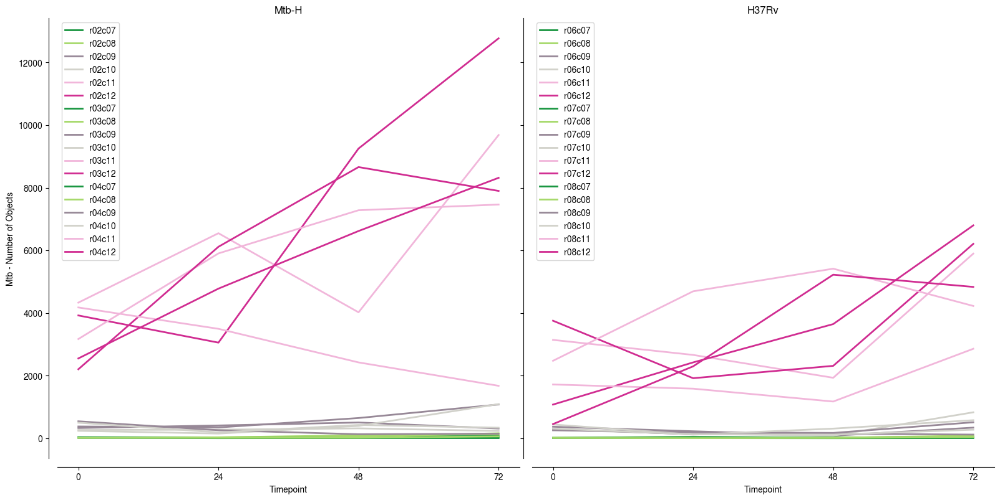

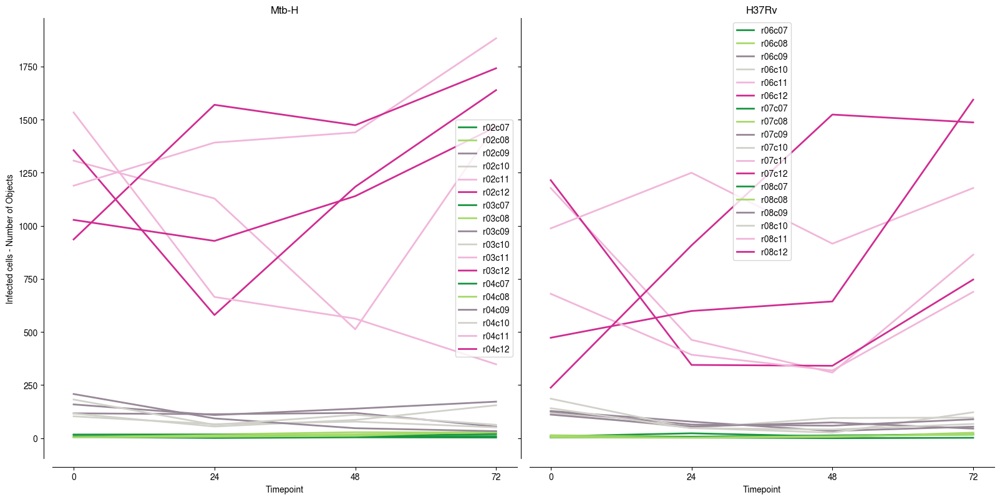

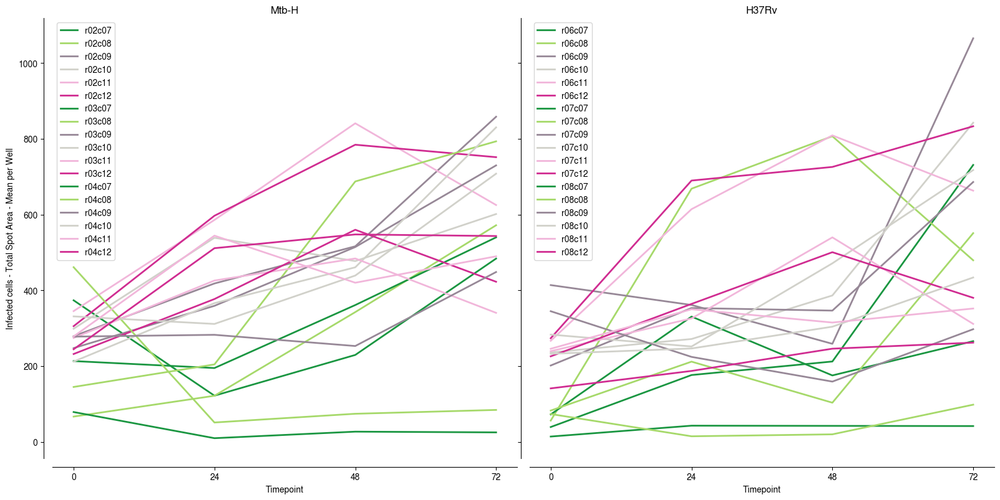

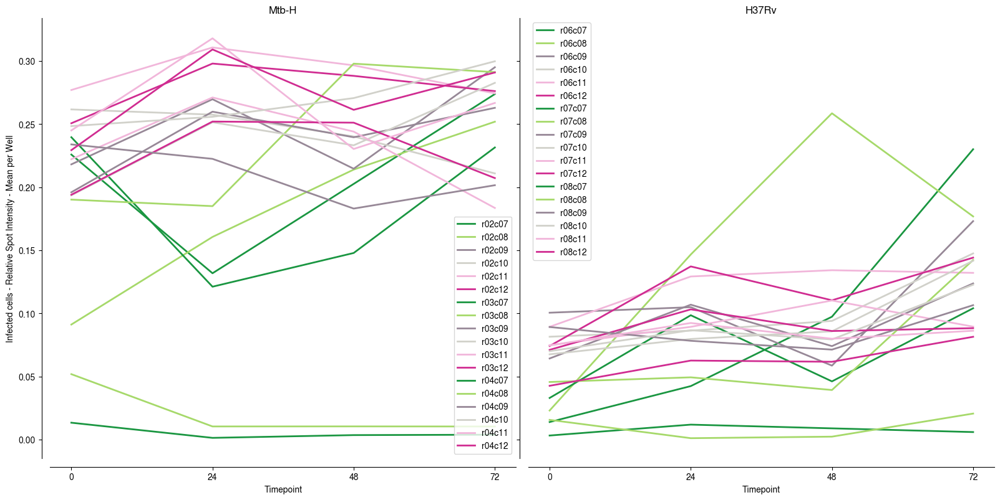

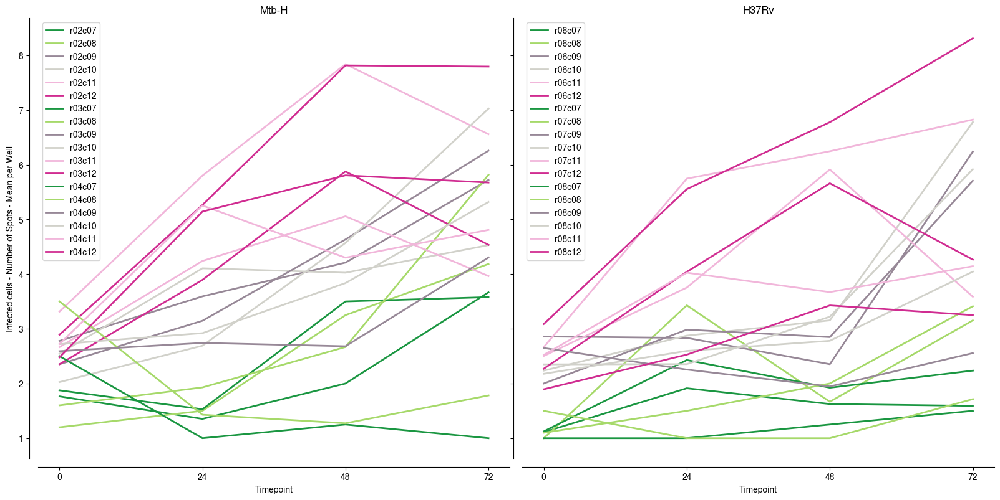

...

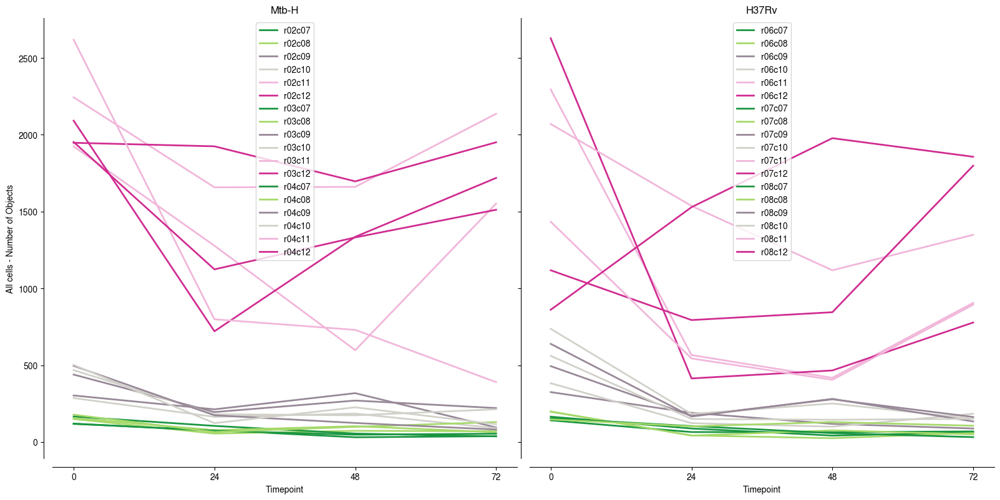

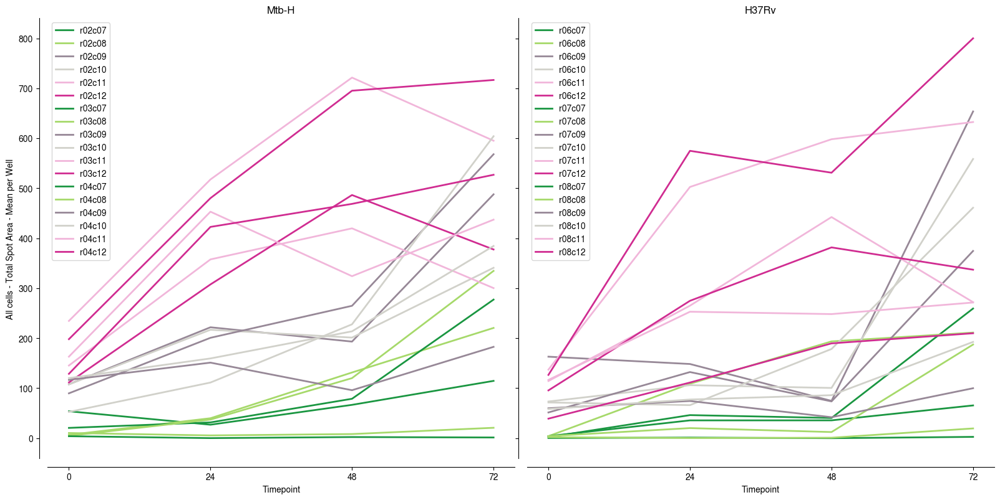

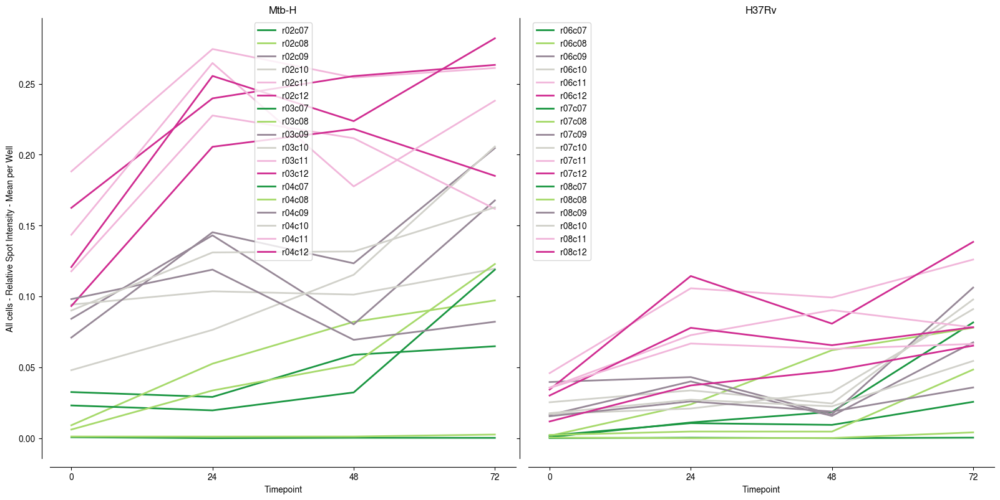

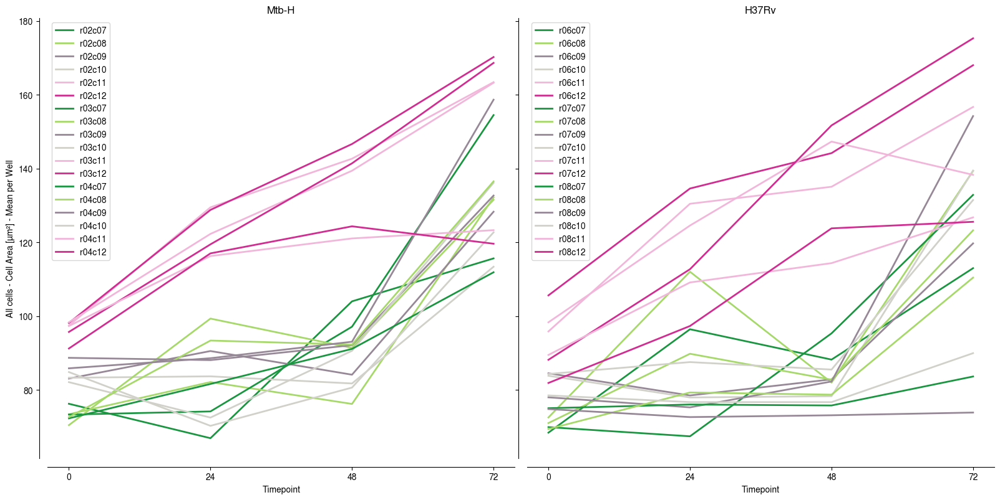

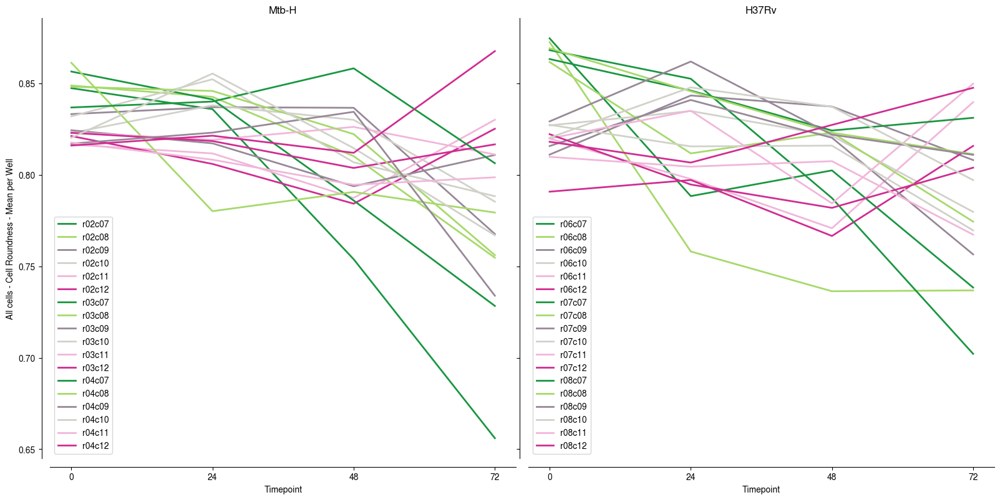

In [148]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Set your custom color palette
color_palette = ['#1a9641', '#a6d96a', '#978897', '#d1d1ca', '#f1b6da', '#d02c91']

# Ensure Timepoint and param are treated as numeric types
df['Timepoint'] = pd.to_numeric(df['Timepoint'], errors='coerce')

# Plotting function
def plot_mtb_category(ax, rows, columns, strain, param, color_palette):
    color_index = 0
    for row in rows:
        for column in columns:
            subset_df = df[(df['Row'] == row) & (df['Column'] == column) & (df['Strain'] == strain)]
            if subset_df.empty:
                continue  # Skip if no data
            # Ensure param is numeric
            subset_df[param] = pd.to_numeric(subset_df[param], errors='coerce')
            
            # Create label with row and column information
            label = f'r{row:02d}c{column:02d}'
            sns.lineplot(
                data=subset_df,
                x='Timepoint',
                y=param,
                color=color_palette[color_index],
                linewidth=2,
                ax=ax,
                label=label
            )
            color_index = (color_index + 1) % len(color_palette)

# Main plotting loop for each parameter
for param in params:
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

    # Plot Mtb-H on the left subplot
    plot_mtb_category(axes[0], [2, 3, 4], [7, 8, 9, 10, 11, 12], 'Mtb-H', param, color_palette)
    axes[0].set_title('Mtb-H')
    axes[0].set_xlabel('Timepoint')
    axes[0].set_ylabel(param)

    # Plot H37Rv on the right subplot
    plot_mtb_category(axes[1], [6, 7, 8], [7, 8, 9, 10, 11, 12], 'H37Rv', param, color_palette)
    axes[1].set_title('H37Rv')
    axes[1].set_xlabel('Timepoint')

    # Set x-axis labels to only show the unique Timepoint values present in the data
    unique_timepoints = sorted(df['Timepoint'].unique())
    axes[0].set_xticks(unique_timepoints)
    axes[1].set_xticks(unique_timepoints)

    # Adjust layout
    plt.tight_layout()
    sns.despine(offset=10)

    # Save the plot with appropriate DPI and tight bounding box
    plt.savefig(os.path.join(output_dir, f'{param}.pdf'), bbox_inches='tight', dpi=314)

    # Show the plot
    plt.show()


# Reading opera metadata

In [78]:
import re
import pandas as pd
import os

# Sample filename pattern
pattern = r'r(?P<Row>\d{2})c(?P<Column>\d{2})f(?P<Field>\d{2})p(?P<Plane>\d{2})-ch(?P<Channel>\d+)sk(?P<Time>\d+)fk(?P<Fk>\d+)fl(?P<Fl>\d+)'

# Folder with image filenames
folder_path = os.path.dirname(metadata_fn)

# Extract metadata from each filename
metadata_list = []
for filename in os.listdir(folder_path):
    match = re.match(pattern, filename)
    if match:
        metadata = match.groupdict()
        metadata_list.append(metadata)

# Create a DataFrame from the metadata
image_metadata_df = pd.DataFrame(metadata_list)

# Convert all relevant columns to integers for analysis
image_metadata_df = image_metadata_df.astype({
    'Row': int,
    'Column': int,
    'Field': int,
    'Plane': int,
    'Channel': int,
    'Time': int,
    'Fk': int,
    'Fl': int
})


# Analyze to determine the image volume (field, plane, and time)
field_count = image_metadata_df['Field'].nunique()
plane_count = image_metadata_df['Plane'].nunique()
time_count = image_metadata_df['Time'].nunique()
ch_count = image_metadata_df['Channel'].nunique()
row_count = image_metadata_df['Row'].nunique()
col_count = image_metadata_df['Column'].nunique()

In [89]:
import tifffile as tiff
import numpy as np
import os
from PIL import Image
from tqdm.auto import tqdm

In [84]:
folder_path

'/run/user/30046150/gvfs/smb-share:server=ds3617xs.local,share=opera2/Baptiste/Leo-datas/Leo_data/240902_moi1_72h_cy5cy3dapi&alex488__2024-09-03T13_26_42-Measurement 1/Images'

In [101]:
# Create a function to load images for a given row, column, and channel
def load_images_for_stack(row, column, channels, planes):
    stack = []  # Store images in a list to stack in Z
    for plane in range(1, planes+1):
        channel_images = []
        for channel in range(1, channels+1):
            # Construct the filename using row, column, plane, and channel
            filename = f'r{row:02d}c{column:02d}f01p{plane:02d}-ch{channel}sk1fk1fl1.tiff'
            filepath = os.path.join(folder_path, filename)
            # Load the image
            image = Image.open(filepath)
            channel_images.append(np.array(image))  # Convert to array for stacking
        stack.append(np.stack(channel_images, axis=0))  # Stack channels along the last axis
    return np.stack(stack, axis=0)  # Stack in Z along the first axis

# Loop over row-column combinations
rows = image_metadata_df['Row'].unique()
columns = image_metadata_df['Column'].unique()
channels = image_metadata_df['Channel'].nunique()
planes = image_metadata_df['Plane'].nunique()

output_dir = '/run/user/30046150/gvfs/smb-share:server=ds3617xs.local,share=opera2/Baptiste/Leo-datas/Leo_data/240902_moi1_72h_cy5cy3dapi&alex488__2024-09-03T13_26_42-Measurement 1/stacked_tiffs' 

# Process for each row and column
for row in tqdm(rows, desc='Iterating over rows'):
    for column in tqdm(columns, desc='Iterating over rows'):
        # Load and stack images
        image_stack = load_images_for_stack(row, column, channels, planes)
        
        # Save the stacked image as a multi-channel TIFF
        output_filename = f'stack_r{row:02d}_c{column:02d}.tiff'
        output_path = os.path.join(output_dir, output_filename)
        tiff.imwrite(output_path, image_stack, 
                     imagej=True,  # ImageJ-compatible format
                     metadata={'axes': 'ZCYX'})  # Specify the axes order for a hyperstack

Iterating over rows:   0%|          | 0/8 [00:00<?, ?it/s]

Iterating over rows:   0%|          | 0/12 [00:00<?, ?it/s]

Iterating over rows:   0%|          | 0/12 [00:00<?, ?it/s]

Iterating over rows:   0%|          | 0/12 [00:00<?, ?it/s]

Iterating over rows:   0%|          | 0/12 [00:00<?, ?it/s]

Iterating over rows:   0%|          | 0/12 [00:00<?, ?it/s]

Iterating over rows:   0%|          | 0/12 [00:00<?, ?it/s]

Iterating over rows:   0%|          | 0/12 [00:00<?, ?it/s]

Iterating over rows:   0%|          | 0/12 [00:00<?, ?it/s]